# A )The Path:


* A ) Load & Preprocess Data ✅
    - Remove duplicates, handle missing values
    - Create datetime features (hour, weekday, etc.)
*    ↓
* B ) Feature Engineering ✅
    - Add lag features, rolling stats, trend, etc.
*    ↓
* C ) Train/Validation/Test Split ✅
    - Based on **time** (e.g., past year = train, recent months = test)
*    ↓
* D ) Feature Selection (Correlation + Granger) ✅
    - Only on **training data** to prevent data leakage!
*    ↓
* E ) Standardization or Normalization ✅
    - Fit scaler on **training data only**
    - Apply to all splits (train/val/test)
*    ↓
* F ) Model Training (with uncertainty method)
    - Example: Deep Ensemble, MC Dropout, or Quantile Regression
*    ↓
* G ) Prediction + Uncertainty Estimation
    - Predict energy + uncertainty interval (mean ± std or quantiles)
*    ↓
* H ) Evaluation (Accuracy + Uncertainty)
    - MAE, RMSE + Calibration, CRPS, or coverage %
*    ↓
* I ) Visualization & Export
    - Plot predictions, uncertainty bounds, and export results


## * B and C ) Feature Engineering    ✅

| Method                 | Type              | Pros                           | Notes                        |
| ---------------------- | ----------------- | ------------------------------ | ---------------------------- |
| Correlation            | Statistical       | Fast, interpretable            | Linear only                  |
| RandomForest / XGBoost | Model-based       | Captures nonlinearity          | Needs fitting                |
| Permutation Importance | Model-based       | Measures real performance drop | Slower                       |
| SHAP                   | Model-based       | Very detailed and visual       | Requires SHAP lib            |
| RFE                    | Wrapper method    | Finds minimal sets             | Slower                       |
| Granger Causality      | Time-series stats | Causal inference               | Only for time-series columns |
*
*
*

| Feature Selection Method                       | Requires Model Training? | Usable Before Model Training? | Explanation                                                                     |
| ---------------------------------------------- | ------------------------ | ----------------------------- | ------------------------------------------------------------------------------- |
| ✅ **Correlation**                              | ❌ No                     | ✅ Yes                         | Fastest statistical method to filter irrelevant features (linear relationships) |
| ✅ **Granger Causality**                        | ❌ No                     | ✅ Yes                         | Used for time series to detect causality before modeling                        |
| ⚠️ **RFE (Recursive Feature Elimination)**     | ✅ Yes                    | ❌ No                          | Internally trains a model multiple times to eliminate features                  |
| ✅ **Univariate Selection** (e.g. chi², f-test) | ❌ No                     | ✅ Yes                         | Good for initial filtering, mostly for classification tasks                     |
| ❌ **Random Forest Importance**                 | ✅ Yes                    | ❌ No                          | Only available after fitting the model                                          |
| ❌ **Permutation Importance**                   | ✅ Yes                    | ❌ No                          | Requires a trained model to test performance drop per feature                   |
| ❌ **SHAP Values**                              | ✅ Yes                    | ❌ No                          | Used for post-training interpretability of feature impact                       |







| Feature                | Lag 1        | Lag 2        | Lag 3        | Granger-Causal? |
| ---------------------- | ------------ | ------------ | ------------ | --------------- |
| `air_temperature`      | 0.0527 ❌     | **0.0000** ✅ | **0.0000** ✅ | ✅ (from lag 2)  |
| `diffuse_r`            | **0.0089** ✅ | **0.0000** ✅ | **0.0000** ✅ | ✅               |
| `dewpoint_temperature` | 0.1055 ❌     | **0.0237** ✅ | 0.0797 ❌     | ✅ (weak)        |
| `elspot`               | 0.3541 ❌     | **0.0000** ✅ | **0.0000** ✅ | ✅ (from lag 2)  |
| `full_solar`           | 0.7152 ❌     | **0.0000** ✅ | **0.0000** ✅ | ✅ (from lag 2)  |
| `global_r`             | **0.0000** ✅ | **0.0000** ✅ | **0.0000** ✅ | ✅               |
| `gust_speed`           | 0.2062 ❌     | **0.0000** ✅ | **0.0000** ✅ | ✅ (from lag 2)  |
| `pressure`             | **0.0000** ✅ | 0.2743 ❌     | **0.0207** ✅ | ✅               |
| `relative_humidity`    | **0.0001** ✅ | **0.0000** ✅ | **0.0000** ✅ | ✅               |
| `wind_direction`       | 0.6085 ❌     | 0.3092 ❌     | **0.0187** ✅ | ✅ (only lag 3)  |
| `wind_speed`           | 0.297 ❌      | **0.0000** ✅ | **0.0000** ✅ | ✅ (from lag 2)  |
| `hour`                 | **0.0000** ✅ | **0.0000** ✅ | **0.0000** ✅ | ✅               |
| `weekday`              | **0.0004** ✅ | **0.0013** ✅ | **0.0002** ✅ | ✅               |
| `sunshine`             | 0.9836 ❌     | **0.0000** ✅ | **0.0000** ✅ | ✅ (from lag 2)  |

❌ Not Granger-Causal (All p > 0.05):
| Feature                 | Reason       |
| ----------------------- | ------------ |
| `cloud_amount`          | All p > 0.70 |
| `horizontal_visibility` | All p > 0.07 |
| `month`                 | All p > 0.21 |
| `dayofyear`             | All p > 0.20 |




| Feature                | Correlation   | Granger Causality | Use?     |
|------------------------|---------------|--------------------|----------|
| air_temperature        | ✅ Low         | ✅ Lag 2–3          | ✅ Keep   |
| cloud_amount           | ❌ Very Low    | ❌ No               | ❌ Drop   |
| dewpoint_temperature   | ❌ Very Low    | ✅ Lag 2            | ✅ Maybe  |
| diffuse_r              | ✅ Medium      | ✅ All Lags         | ✅ Keep   |
| elspot                 | ✅ Medium      | ✅ Lag 2–3          | ✅ Keep   |
| full_solar             | ✅ Low         | ✅ Lag 2–3          | ✅ Keep   |
| global_r               | ✅ Medium      | ✅ All Lags         | ✅ Keep   |
| gust_speed             | ✅ Low         | ✅ Lag 2–3          | ✅ Keep   |
| horizontal_visibility  | ❌ Near Zero   | ❌ Weak             | ❌ Drop   |
| pressure               | ❌ Very Low    | ✅ Lag 1/3          | ✅ Maybe  |
| relative_humidity      | ❌ Negative    | ✅ All Lags         | ✅ Keep   |
| sunshine               | ✅ Low         | ✅ Lag 2–3          | ✅ Keep   |
| wind_direction         | ❌ Near Zero   | ✅ Lag 3            | ✅ Maybe  |
| wind_speed             | ✅ Low         | ✅ Lag 2–3          | ✅ Keep   |
| hour                   | ✅ Medium      | ✅ All Lags         | ✅ Keep   |
| weekday                | ❌ Negative    | ✅ All Lags         | ✅ Keep   |
| month                  | ❌ Negative    | ❌ No               | ❌ Drop   |
| dayofyear              | ❌ Negative    | ❌ No               | ❌ Drop   |



Excel file saved successfully.
Testing data shape is (2208, 16) and number of rows are (2208).
Excel file saved successfully.
Validation data shape is (5856, 16) and number of rows are (5856).
Excel file saved successfully.
Training data shape is (11712, 16) and number of rows are (11712).
 Full Data Types:
datetime                 datetime64[us, UTC]
air_temperature                      float64
cloud_amount                         float64
dewpoint_temperature                 float64
diffuse_r                            float64
elspot                               float64
energy                               float64
full_solar                           float64
global_r                             float64
gust_speed                           float64
horizontal_visibility                float64
pressure                             float64
relative_humidity                    float64
sunshine                             float64
wind_direction                       float64
wind_speed      

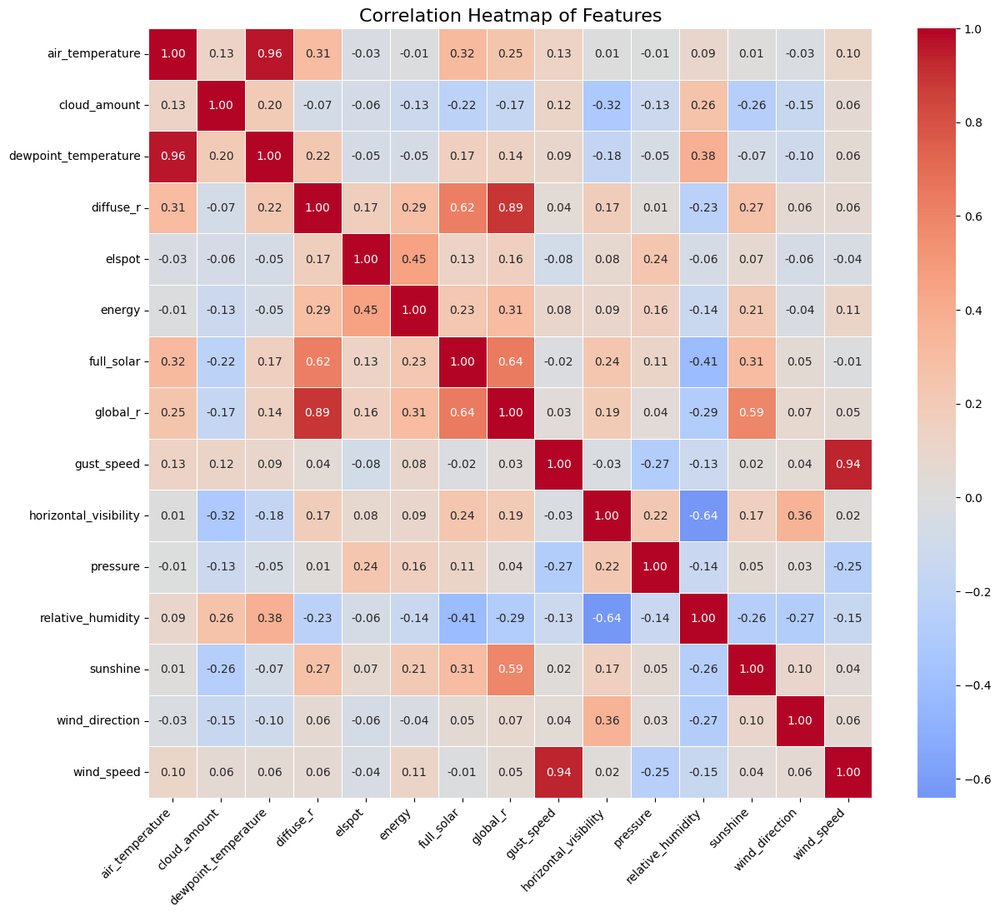

cloud_amount             529
full_solar               503
global_r                 380
diffuse_r                379
elspot                   164
relative_humidity        154
pressure                 127
sunshine                  85
wind_speed                41
dewpoint_temperature      14
air_temperature           13
gust_speed                 9
datetime                   0
energy                     0
horizontal_visibility      0
wind_direction             0
dtype: int64
cloud_amount             138
sunshine                  73
global_r                  71
full_solar                63
diffuse_r                 61
elspot                    45
relative_humidity         37
wind_speed                12
air_temperature            6
dewpoint_temperature       3
gust_speed                 2
energy                     0
horizontal_visibility      0
pressure                   0
wind_direction             0
dtype: int64


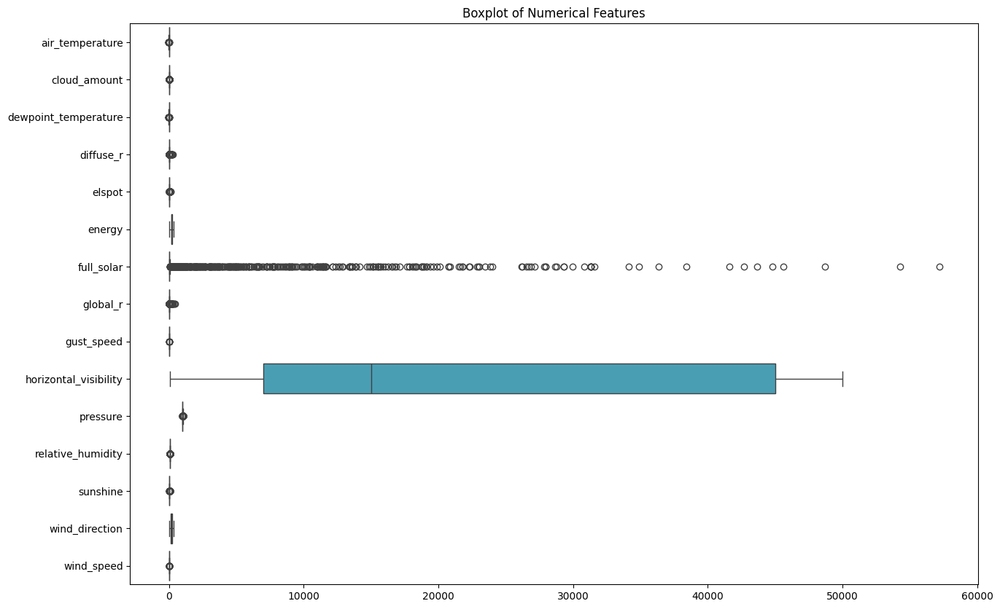

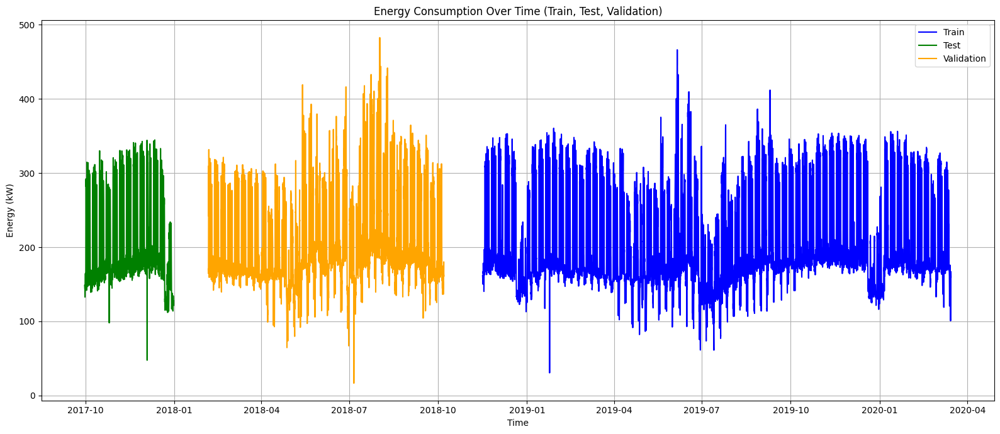

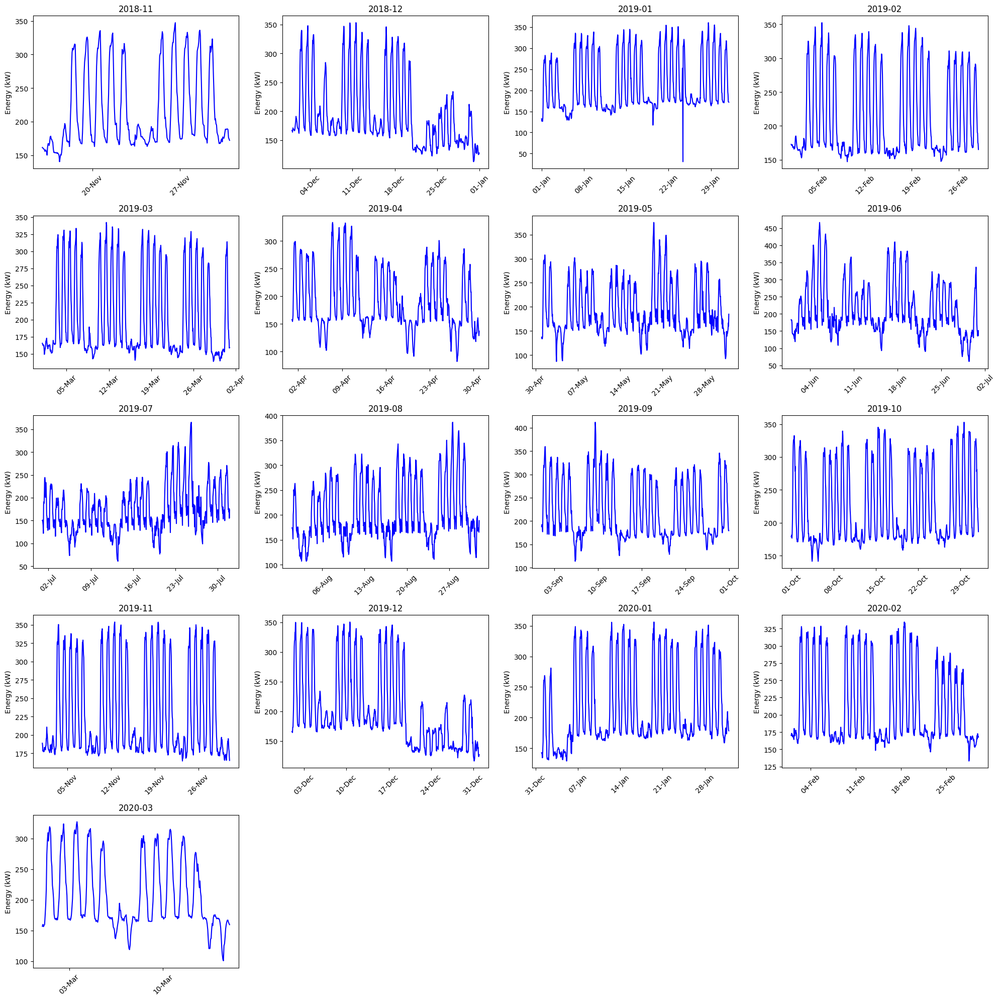

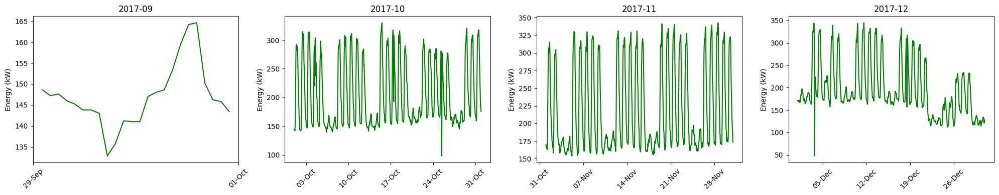

energy                   1.000000
elspot                   0.269041
diffuse_r                0.213942
global_r                 0.164275
full_solar               0.133066
sunshine                 0.114353
gust_speed               0.099666
hour                     0.091374
wind_speed               0.083593
air_temperature          0.035364
cloud_amount             0.033265
pressure                 0.024049
dewpoint_temperature     0.010044
wind_direction           0.001989
month                   -0.001882
dayofyear               -0.004957
horizontal_visibility   -0.021983
relative_humidity       -0.055665
weekday                 -0.248812
Name: energy, dtype: float64

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=3.7545  , p=0.0527  , df_denom=11708, df_num=1
ssr based chi2 test:   chi2=3.7555  , p=0.0526  , df=1
likelihood ratio test: chi2=3.7549  , p=0.0527  , df=1
parameter F test:         F=3.7545  , p=0.0527  , df_denom=11708, df_num=1

Granger Causality


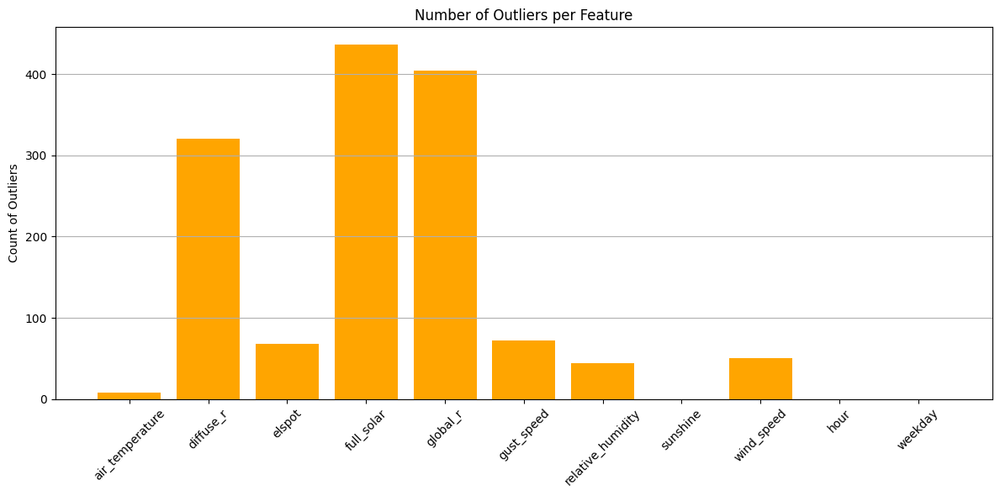

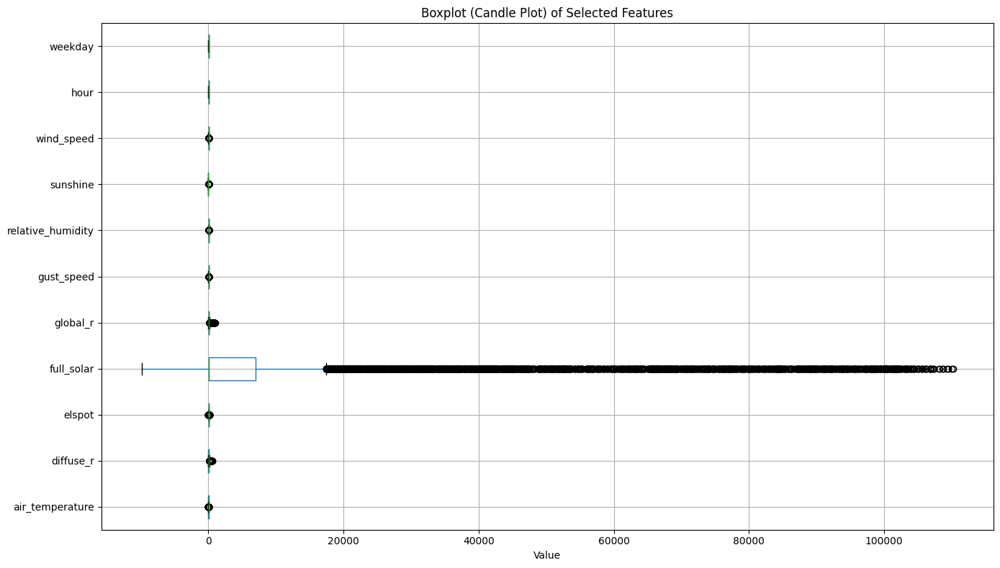

=== Outlier & Range Analysis (Standardized) ===

📌 Feature: air_temperature
  ➤ Min value     : -3.365
  ➤ Max value     : 3.010
  ➤ Mean ± Std    : -0.00 ± 1.00
  ⚠ Outliers found: 8
    Outlier values (first 5): [-3.17033215 -3.06713594 -3.36525832 -3.33085958 -3.36525832]

📌 Feature: diffuse_r
  ➤ Min value     : -0.541
  ➤ Max value     : 7.959
  ➤ Mean ± Std    : -0.00 ± 1.00
  ⚠ Outliers found: 320
    Outlier values (first 5): [3.13942081 3.31836246 3.2274249  4.23360499 4.18226928]

📌 Feature: elspot
  ➤ Min value     : -2.573
  ➤ Max value     : 9.645
  ➤ Mean ± Std    : -0.00 ± 1.00
  ⚠ Outliers found: 68
    Outlier values (first 5): [3.19901336 3.72576628 5.26757146 4.14936596 3.02810859]

📌 Feature: full_solar
  ➤ Min value     : -0.893
  ➤ Max value     : 4.426
  ➤ Mean ± Std    : -0.00 ± 1.00
  ⚠ Outliers found: 436
    Outlier values (first 5): [3.12566683 3.40353622 3.40436734 3.22049132 3.66444546]

📌 Feature: global_r
  ➤ Min value     : -0.507
  ➤ Max value     : 5.

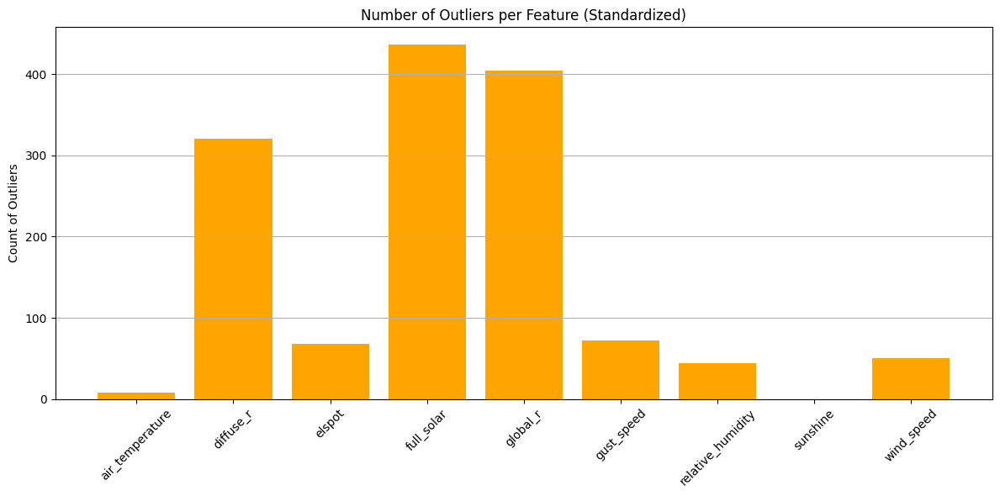

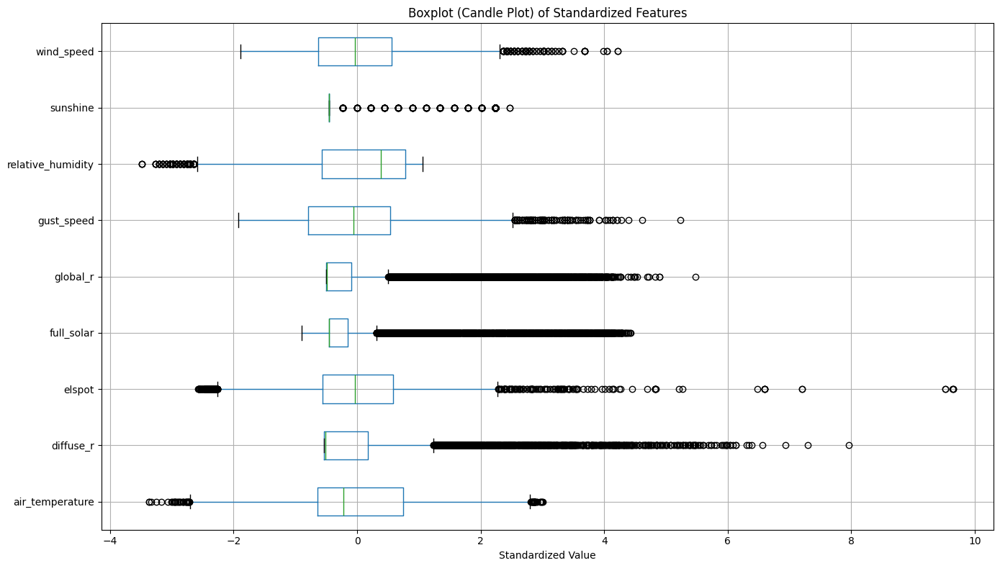

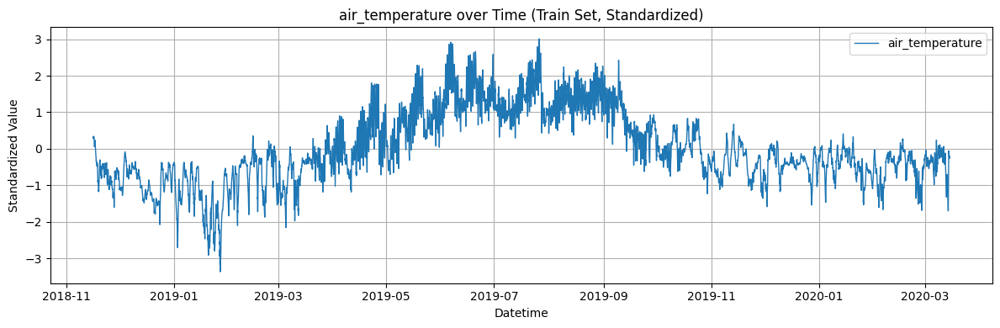

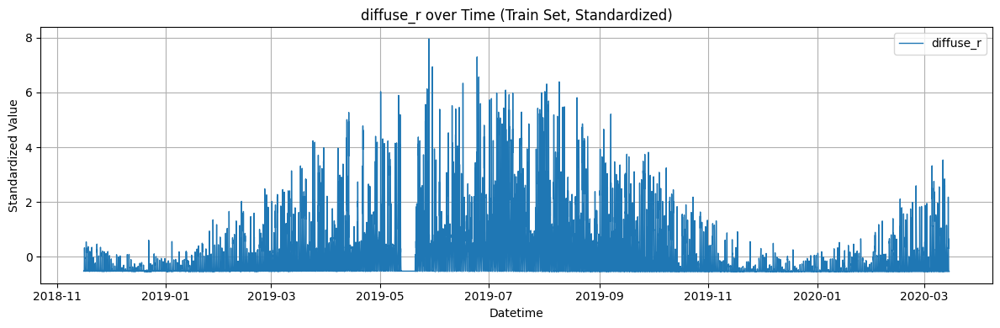

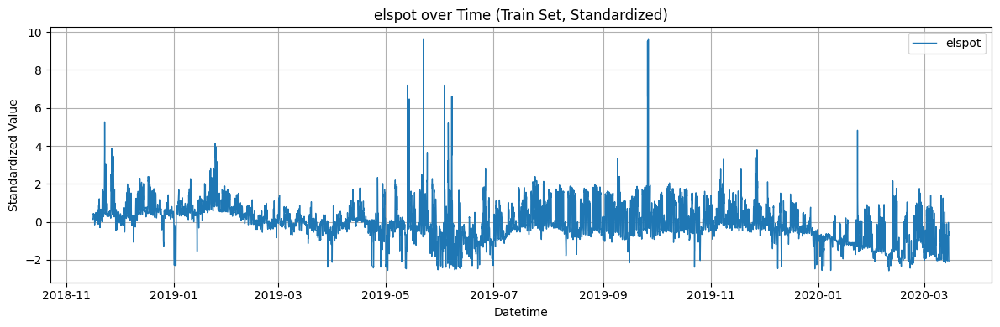

...

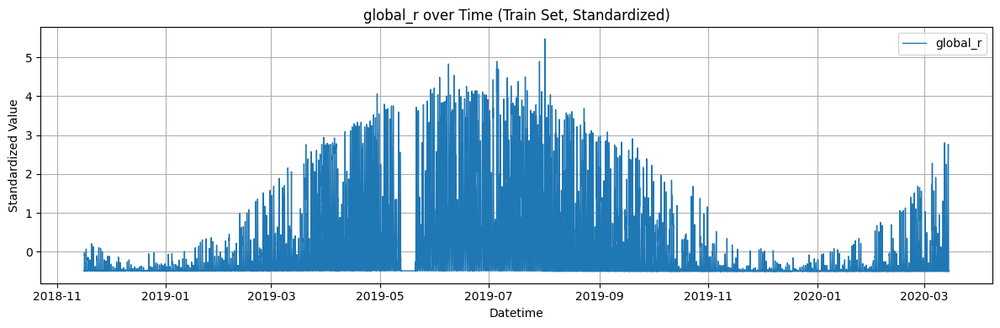

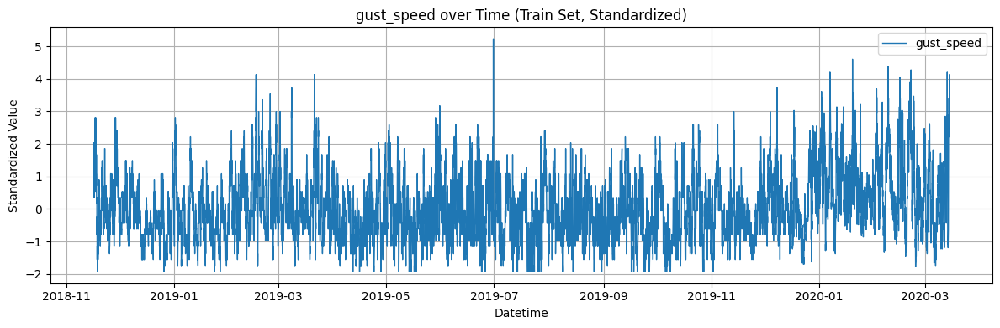

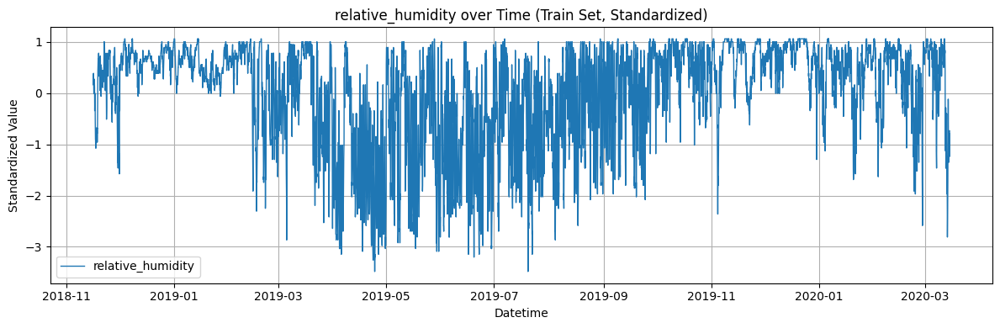

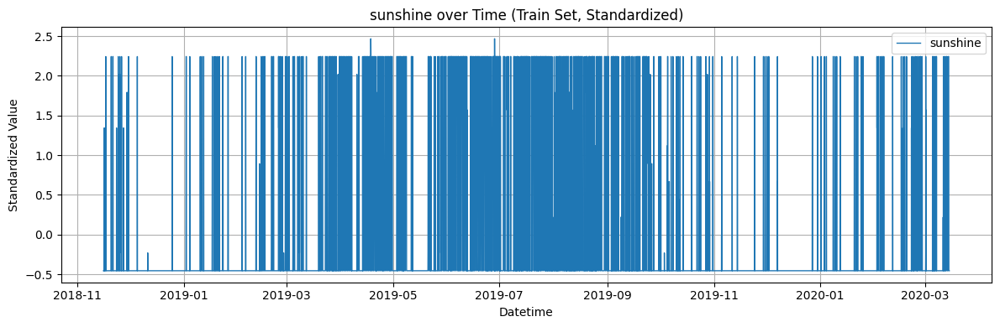

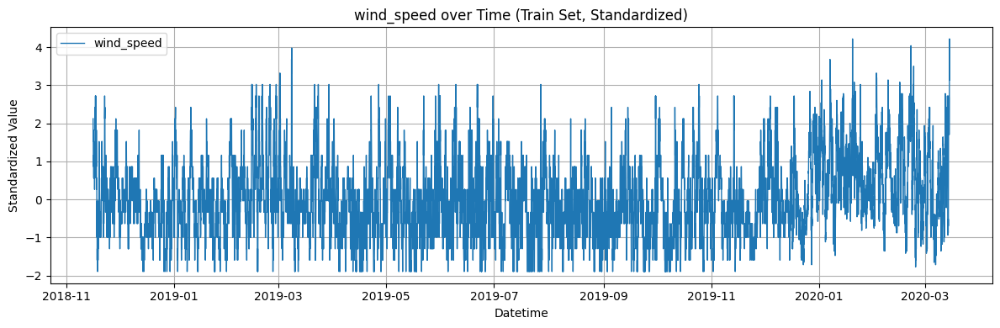

             datetime  energy  air_temperature  diffuse_r    elspot  \
0 2018-11-16 00:00:00   161.6         0.326873  -0.528883  0.149584   
1 2018-11-16 01:00:00   160.6         0.315406  -0.530350  0.127610   
2 2018-11-16 02:00:00   160.2         0.303940  -0.525950  0.136156   
3 2018-11-16 03:00:00   159.0         0.303940  -0.524483  0.164843   
4 2018-11-16 04:00:00   158.0         0.303940  -0.525950  0.274100   
5 2018-11-16 05:00:00   155.8         0.303940  -0.520083  0.333307   
6 2018-11-16 06:00:00   158.0         0.269541  -0.525950  0.415097   
7 2018-11-16 07:00:00   156.4         0.303940  -0.436479  0.440732   
8 2018-11-16 08:00:00   156.0         0.292474   0.205951  0.391902   
9 2018-11-16 09:00:00   150.2         0.326873   0.311556  0.357722   

   full_solar  global_r  gust_speed  relative_humidity  sunshine  wind_speed  
0   -0.456244 -0.491608    1.855847           0.218629 -0.455473    2.123126  
1   -0.456235 -0.491033    1.488741           0.162524 -0.45

In [1]:
## * A ) Load & Preprocess Data ✅
# === Force only GPU:1 ===
import os
os.environ["CUDA_VISIBLE_DEVICES"] = "0"


import pandas as pd
# Load the dataset
df = pd.read_parquet("dataset_0.parquet")
# Remove timezone info from the datetime column
df["datetime"] = df["datetime"].dt.tz_localize(None)
# Save to Excel
df.to_excel("0_weather_data_testing_0.xlsx", index=False)
print("Excel file saved successfully.")
print(f"Testing data shape is {df.shape} and number of rows are ({len(df)}).")

################################################################
df = pd.read_parquet("dataset_1.parquet")
# Remove timezone info from the datetime column
df["datetime"] = df["datetime"].dt.tz_localize(None)
# Save to Excel
df.to_excel("1_weather_data_validation_1.xlsx", index=False)
print("Excel file saved successfully.")
print(f"Validation data shape is {df.shape} and number of rows are ({len(df)}).")

################################################################

df_Train = pd.read_parquet("dataset_2.parquet")
# Remove timezone info from the datetime column
df_Train["datetime"] = df_Train["datetime"].dt.tz_localize(None)
# Save to Excel
df_Train.to_excel("2_weather_data_training_2.xlsx", index=False)
print("Excel file saved successfully.")
print(f"Training data shape is {df_Train.shape} and number of rows are ({len(df_Train)}).")


df.isnull().sum()
# Load your data
df = pd.read_parquet("dataset_2.parquet")
# Check full data types
print(" Full Data Types:")
print(df.dtypes)
# Separate columns by type
datetime_cols = df.select_dtypes(include=['datetime64[ns]', 'datetime64[ns, UTC]']).columns.tolist()
numerical_cols = df.select_dtypes(include=['int64', 'float64']).columns.tolist()
categorical_cols = df.select_dtypes(include=['object', 'category', 'bool']).columns.tolist()
# Show results
print("\n Datetime Columns:", datetime_cols)
print(" Numerical Columns:", numerical_cols)
print(" Categorical Columns:", categorical_cols)

## * B and C ) Feature Engineering    ✅
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import zscore
# Assuming you already have the DataFrame loaded and processed
df = pd.read_parquet("dataset_0.parquet")
df_numeric = df.drop(columns=["datetime"])
corr = df_numeric.corr()

# Plot
plt.figure(figsize=(14, 12))
sns.heatmap(corr, annot=True, fmt=".2f", cmap="coolwarm", center=0, linewidths=0.5)
plt.title("Correlation Heatmap of Features", fontsize=16)
plt.xticks(rotation=45, ha="right")
plt.yticks(rotation=0)

# Save to file
plt.savefig("correlation_heatmap.png", dpi=300, bbox_inches='tight')
plt.show()
df.corr()

import pandas as pd

# Assuming df is your DataFrame
Q1 = df.quantile(0.25)
Q3 = df.quantile(0.75)
IQR = Q3 - Q1

outliers = ((df < (Q1 - 1.5 * IQR)) | (df > (Q3 + 1.5 * IQR)))
outlier_counts = outliers.sum().sort_values(ascending=False)
print(outlier_counts)

z_scores = df.select_dtypes(include=['float64', 'int64']).apply(zscore)
outliers_z = (z_scores.abs() > 3)
outlier_counts_z = outliers_z.sum().sort_values(ascending=False)
print(outlier_counts_z)

import seaborn as sns
import matplotlib.pyplot as plt

# Plot all features
plt.figure(figsize=(15, 10))
sns.boxplot(data=df.select_dtypes(include='number'), orient="h")
plt.title("Boxplot of Numerical Features")

# Save before showing
plt.savefig("Boxplot of Numerical Features.png", dpi=300, bbox_inches='tight')
plt.show()



# Starting date: 2018-11-16
# Ending date: 2020-03-14
# Number of days: 484
# Number of months: 16
# Import libraries
import pandas as pd
import matplotlib.pyplot as plt

# Load each Excel file
df_Train = pd.read_excel("2_weather_data_training_2.xlsx")
df_Test = pd.read_excel("0_weather_data_testing_0.xlsx")
df_Val = pd.read_excel("1_weather_data_validation_1.xlsx")

# Convert 'datetime' column to datetime type
df_Train['datetime'] = pd.to_datetime(df_Train['datetime'])
df_Test['datetime'] = pd.to_datetime(df_Test['datetime'])
df_Val['datetime'] = pd.to_datetime(df_Val['datetime'])

# Plot all three datasets
plt.figure(figsize=(16, 7))
plt.plot(df_Train['datetime'], df_Train['energy'], label='Train', color='blue')
plt.plot(df_Test['datetime'], df_Test['energy'], label='Test', color='green')
plt.plot(df_Val['datetime'], df_Val['energy'], label='Validation', color='orange')

# Formatting
plt.xlabel('Time')
plt.ylabel('Energy (kW)')
plt.title('Energy Consumption Over Time (Train, Test, Validation)')
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()



# Import required libraries
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates  # ✅ import for handling date axes

# Load the Excel file
file_path = "2_weather_data_training_2.xlsx"
df_Train = pd.read_excel(file_path)

# Convert the 'datetime' column to datetime type
df_Train['datetime'] = pd.to_datetime(df_Train['datetime'])

# Set datetime as index for easier filtering
df_Train.set_index('datetime', inplace=True)

# Determine how many unique months we have
unique_months = df_Train.groupby([df_Train.index.year, df_Train.index.month]).ngroups
ncols = 4
nrows = (unique_months + ncols - 1) // ncols  # ceiling division

# Create subplots
fig, axs = plt.subplots(nrows, ncols, figsize=(5 * ncols, 4 * nrows))
axs = axs.flatten()

# Loop through each month and plot energy vs. time
for i, ((year, month), group) in enumerate(df_Train.groupby([df_Train.index.year, df_Train.index.month])):
    axs[i].plot(group.index, group['energy'], color='blue')
    axs[i].set_title(f"{year}-{month:02d}")
    axs[i].xaxis.set_major_locator(mdates.WeekdayLocator(interval=1))
    axs[i].xaxis.set_major_formatter(mdates.DateFormatter('%d-%b'))
    axs[i].tick_params(axis='x', rotation=45)
    axs[i].set_ylabel('Energy (kW)')

# Hide any unused subplots
for j in range(i + 1, len(axs)):
    axs[j].axis('off')

# Layout and display
plt.tight_layout()
plt.show()

# Load the Excel file
file_path = "0_weather_data_testing_0.xlsx"
df_Test = pd.read_excel(file_path)

# Convert the 'datetime' column to datetime type
df_Test['datetime'] = pd.to_datetime(df_Test['datetime'])

# Set datetime as index for easier filtering
df_Test.set_index('datetime', inplace=True)

# Determine how many unique months we have
unique_months = df_Test.groupby([df_Test.index.year, df_Test.index.month]).ngroups
ncols = 4
nrows = (unique_months + ncols - 1) // ncols  # ceiling division

# Create subplots
fig, axs = plt.subplots(nrows, ncols, figsize=(5 * ncols, 4 * nrows))
axs = axs.flatten()

# Loop through each month and plot energy vs. time
for i, ((year, month), group) in enumerate(df_Test.groupby([df_Test.index.year, df_Test.index.month])):
    axs[i].plot(group.index, group['energy'], color='green')
    axs[i].set_title(f"{year}-{month:02d}")
    axs[i].xaxis.set_major_locator(mdates.WeekdayLocator(interval=1))
    axs[i].xaxis.set_major_formatter(mdates.DateFormatter('%d-%b'))
    axs[i].tick_params(axis='x', rotation=45)
    axs[i].set_ylabel('Energy (kW)')

# Hide any unused subplots
for j in range(i + 1, len(axs)):
    axs[j].axis('off')

# Layout and display
plt.tight_layout()
plt.show()

############## features selection
import pandas as pd
# Load your data
df = pd.read_excel("2_weather_data_training_2.xlsx")
# Convert datetime column
df['datetime'] = pd.to_datetime(df['datetime'])
# Extract time-based features
df['hour'] = df['datetime'].dt.hour
df['weekday'] = df['datetime'].dt.weekday
df['month'] = df['datetime'].dt.month
df['dayofyear'] = df['datetime'].dt.dayofyear
# Drop datetime for correlation analysis
df_corr = df.drop(columns=['datetime'])

# Compute correlations with 'energy'
correlations = df_corr.corr()['energy'].sort_values(ascending=False)

# Show top correlated features
print(correlations)
# step one: selected_features Based on the correlation
selected_features1 = [
    'elspot',          # +0.269 → strong positive correlation
    'diffuse_r',       # +0.214 → solar radiation (diffuse)
    'global_r',        # +0.164 → solar radiation (global)
    'full_solar',      # +0.133 → total solar energy
    'sunshine',        # +0.114 → limited reliability, moderate correlation (optional)
    'gust_speed',      # +0.100 → slight positive correlation (optional)
    'hour',            # +0.091 → weak, but useful for temporal patterns
    'weekday'          # –0.249 → strong negative correlation (very useful!)
]

import pandas as pd
from statsmodels.tsa.stattools import grangercausalitytests

# Load your Excel file
df = pd.read_excel("2_weather_data_training_2.xlsx")

# Convert datetime column and set it as index
df['datetime'] = pd.to_datetime(df['datetime'])
df.set_index('datetime', inplace=True)

# Create time-based features
df['hour'] = df.index.hour
df['weekday'] = df.index.weekday
df['month'] = df.index.month
df['dayofyear'] = df.index.dayofyear

# Get all columns except the target variable
features_to_test = [col for col in df.columns if col != 'energy']

# Dictionary to store p-values of Granger test
granger_results = {}

# Run Granger causality test for each feature
for feature in features_to_test:
    try:
        # Drop missing values
        data = df[[feature, 'energy']].dropna()

        # Perform Granger test (maxlag = 3)
        result = grangercausalitytests(data, maxlag=3)


        # Extract p-values from SSR F-test
        p_values = [round(result[lag][0]['ssr_ftest'][1], 4) for lag in range(1, 4)]

        # Store the result
        granger_results[feature] = p_values
    except Exception as e:
        granger_results[feature] = [f"Error: {str(e)}"] * 3

# Print the results
print("Granger Causality Test (p-values for lags 1 to 3):\n")
print(f"{'Feature':<25} {'Lag 1':<10} {'Lag 2':<10} {'Lag 3':<10}")
print("-" * 60)
for feature, pvals in granger_results.items():
    print(f"{feature:<25} {pvals[0]:<10} {pvals[1]:<10} {pvals[2]:<10}")



#Step two feature selection based on features_Granger

selected_features_Granger = [
    'air_temperature',
    'diffuse_r',
    'dewpoint_temperature',
    'elspot',
    'full_solar',
    'global_r',
    'gust_speed',
    'pressure',
    'relative_humidity',
    'wind_direction',
    'wind_speed',
    'hour',
    'weekday',
    'sunshine'
]
# Selected features for energy prediction
selected_features = [
    'air_temperature',       # importance ≈ 3.5%   (✅ required)
    'diffuse_r',             # importance ≈ 21.4%  (✅ required)
    'elspot',                # importance ≈ 26.9%  (✅ required)
    'full_solar',            # importance ≈ 13.3%  (✅ required)
    'global_r',              # importance ≈ 16.4%  (✅ required)
    'gust_speed',            # importance ≈ 9.9%   (⚠️ optional)
    'relative_humidity',     # importance ≈ 5.6%   (⚠️ optional)
    'sunshine',              # importance ≈ 11.4%  (⚠️ optional)
    'wind_speed',            # importance ≈ 8.4%   (⚠️ optional)
    'hour',                  # importance ≈ 9.1%   (✅ required)
    'weekday',               # importance ≈ 24.9%  (✅ required, despite negative correlation)
]

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.stats import zscore

# Load training data
df_Train = pd.read_excel("2_weather_data_training_2.xlsx")

# Add 'hour' and 'weekday' columns
df_Train['datetime'] = pd.to_datetime(df_Train['datetime'])
df_Train['hour'] = df_Train['datetime'].dt.hour
df_Train['weekday'] = df_Train['datetime'].dt.weekday

# Selected features for analysis
selected_features = [
    'air_temperature',
    'diffuse_r',
    'elspot',
    'full_solar',
    'global_r',
    'gust_speed',
    'relative_humidity',
    'sunshine',
    'wind_speed',
    'hour',
    'weekday',
]

# Dictionary to store outlier counts
outlier_counts = {}

# Outlier detection and summary statistics
print("=== Outlier & Range Analysis ===")
for feature in selected_features:
    data = df_Train[feature].dropna()
    z_scores = zscore(data)
    outliers = data[np.abs(z_scores) > 3]
    outlier_counts[feature] = len(outliers)

    print(f"\n📌 Feature: {feature}")
    print(f"  ➤ Min value     : {data.min():.3f}")
    print(f"  ➤ Max value     : {data.max():.3f}")
    print(f"  ➤ Mean ± Std    : {data.mean():.2f} ± {data.std():.2f}")
    print(f"  ⚠ Outliers found: {len(outliers)}")
    if len(outliers) > 0:
        print(f"    Outlier values (first 5): {outliers.head().values}")

# -----------------------------
# Bar Plot of Outlier Counts
# -----------------------------
plt.figure(figsize=(12, 6))
plt.bar(outlier_counts.keys(), outlier_counts.values(), color='orange')
plt.title("Number of Outliers per Feature")
plt.ylabel("Count of Outliers")
plt.xticks(rotation=45)
plt.grid(True, axis='y')
plt.tight_layout()
plt.show()

# -----------------------------
# Boxplot (Candle Plot)
# -----------------------------
plt.figure(figsize=(14, 8))
df_Train[selected_features].boxplot(vert=False)
plt.title("Boxplot (Candle Plot) of Selected Features")
plt.xlabel("Value")
plt.grid(True)
plt.tight_layout()
plt.show()


### standardization
from sklearn.preprocessing import StandardScaler
import pandas as pd

# Load the datasets
df_Train = pd.read_excel("2_weather_data_training_2.xlsx")
df_Test = pd.read_excel("0_weather_data_testing_0.xlsx")
df_Val = pd.read_excel("1_weather_data_validation_1.xlsx")

# Add hour and weekday to all DataFrames
for df in [df_Train, df_Test, df_Val]:
    df['datetime'] = pd.to_datetime(df['datetime'])
    df['hour'] = df['datetime'].dt.hour
    df['weekday'] = df['datetime'].dt.weekday

# Define selected features
selected_features = [
    'air_temperature', 'diffuse_r', 'elspot', 'full_solar',
    'global_r', 'gust_speed', 'relative_humidity', 'sunshine',
    'wind_speed', 'hour', 'weekday'
]

# Extract selected features
X_train = df_Train[selected_features].copy()
X_test = df_Test[selected_features].copy()
X_val = df_Val[selected_features].copy()

# Standardize features
scaler = StandardScaler()
X_train_scaled = pd.DataFrame(scaler.fit_transform(X_train), columns=selected_features, index=X_train.index)
X_test_scaled = pd.DataFrame(scaler.transform(X_test), columns=selected_features, index=X_test.index)
X_val_scaled = pd.DataFrame(scaler.transform(X_val), columns=selected_features, index=X_val.index)



import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from scipy.stats import zscore

# Load data
df_Train = pd.read_excel("2_weather_data_training_2.xlsx")
df_Test = pd.read_excel("0_weather_data_testing_0.xlsx")
df_Val = pd.read_excel("1_weather_data_validation_1.xlsx")

# Add 'hour' and 'weekday' if needed (used only in preprocessing, not analysis)
for df in [df_Train, df_Test, df_Val]:
    df['datetime'] = pd.to_datetime(df['datetime'])
    df['hour'] = df['datetime'].dt.hour
    df['weekday'] = df['datetime'].dt.weekday

# Selected features (excluding datetime, hour, weekday)
selected_features = [
    'air_temperature', 'diffuse_r', 'elspot', 'full_solar',
    'global_r', 'gust_speed', 'relative_humidity', 'sunshine',
    'wind_speed'
]

# Standardize selected features
scaler = StandardScaler()
X_train_scaled = pd.DataFrame(scaler.fit_transform(df_Train[selected_features]),
                              columns=selected_features, index=df_Train.index)

# Outlier detection and statistics
outlier_counts = {}

print("=== Outlier & Range Analysis (Standardized) ===")
for feature in selected_features:
    data = X_train_scaled[feature]
    z_scores = zscore(data)
    outliers = data[np.abs(z_scores) > 3]
    outlier_counts[feature] = len(outliers)

    print(f"\n📌 Feature: {feature}")
    print(f"  ➤ Min value     : {data.min():.3f}")
    print(f"  ➤ Max value     : {data.max():.3f}")
    print(f"  ➤ Mean ± Std    : {data.mean():.2f} ± {data.std():.2f}")
    print(f"  ⚠ Outliers found: {len(outliers)}")
    if len(outliers) > 0:
        print(f"    Outlier values (first 5): {outliers.head().values}")

# Plot bar chart of outlier counts
plt.figure(figsize=(12, 6))
plt.bar(outlier_counts.keys(), outlier_counts.values(), color='orange')
plt.title("Number of Outliers per Feature (Standardized)")
plt.ylabel("Count of Outliers")
plt.xticks(rotation=45)
plt.grid(True, axis='y')
plt.tight_layout()
plt.show()

# Plot boxplots (candle plots)
plt.figure(figsize=(14, 8))
X_train_scaled.boxplot(vert=False)
plt.title("Boxplot (Candle Plot) of Standardized Features")
plt.xlabel("Standardized Value")
plt.grid(True)
plt.tight_layout()
plt.show()
import seaborn as sns
import matplotlib.pyplot as plt
## * D and E ) Standardization (after split!)    ✅
# Import required libraries
import pandas as pd
from statsmodels.tsa.stattools import grangercausalitytests
import matplotlib.pyplot as plt
import matplotlib.dates as mdates  # ✅ import for handling date axes
from scipy.stats import zscore
import pandas as pd
from sklearn.preprocessing import StandardScaler
# Load Excel files
df_Train = pd.read_excel("2_weather_data_training_2.xlsx")
df_Test = pd.read_excel("0_weather_data_testing_0.xlsx")
df_Val = pd.read_excel("1_weather_data_validation_1.xlsx")
# Selected features (excluding datetime for scaling)
features_to_scale = [
    'air_temperature',       # importance ≈ 3.5%   (✅ required)
    'diffuse_r',             # importance ≈ 21.4%  (✅ required)
    'elspot',                # importance ≈ 26.9%  (✅ required)
    'full_solar',            # importance ≈ 13.3%  (✅ required)
    'global_r',              # importance ≈ 16.4%  (✅ required)
    'gust_speed',            # importance ≈ 9.9%   (⚠️ optional)
    'relative_humidity',     # importance ≈ 5.6%   (⚠️ optional)
    'sunshine',              # importance ≈ 11.4%  (⚠️ optional)
    'wind_speed',            # importance ≈ 8.4%   (⚠️ optional)
    ]
# Extract 'datetime' columns
datetime_train = df_Train['datetime']
datetime_test = df_Test['datetime']
datetime_val = df_Val['datetime']
# Initialize and fit the scaler on training data
scaler = StandardScaler()
X_train_scaled = pd.DataFrame(scaler.fit_transform(df_Train[features_to_scale]),
                              columns=features_to_scale, index=df_Train.index)
X_test_scaled = pd.DataFrame(scaler.transform(df_Test[features_to_scale]),
                             columns=features_to_scale, index=df_Test.index)
X_val_scaled = pd.DataFrame(scaler.transform(df_Val[features_to_scale]),
                            columns=features_to_scale, index=df_Val.index)
# Reattach 'datetime' column at the front
X_train_scaled.insert(0, 'datetime', datetime_train)
X_test_scaled.insert(0, 'datetime', datetime_test)
X_val_scaled.insert(0, 'datetime', datetime_val)
import matplotlib.pyplot as plt

# List of features to plot
features_to_scale = [
    'air_temperature',
    'diffuse_r',
    'elspot',
    'full_solar',
    'global_r',
    'gust_speed',
    'relative_humidity',
    'sunshine',
    'wind_speed',
]

# Function to plot feature over time for a given dataset
def plot_features_over_time(df_scaled, dataset_name):
    for feature in features_to_scale:
        plt.figure(figsize=(12, 4))
        plt.plot(df_scaled['datetime'], df_scaled[feature], label=feature, linewidth=1)
        plt.title(f"{feature} over Time ({dataset_name}, Standardized)")
        plt.xlabel("Datetime")
        plt.ylabel("Standardized Value")
        plt.grid(True)
        plt.legend()
        plt.tight_layout()
        plt.show()

# Plot for Train, Test, and Validation datasets
plot_features_over_time(X_train_scaled, "Train Set")
#plot_features_over_time(X_test_scaled, "Test Set")
#plot_features_over_time(X_val_scaled, "Validation Set")
# Show the first 10 rows of the standardized training data
# Add the 'energy' column from the original training data (not standardized)
X_train_scaled.insert(1, 'energy', df_Train['energy'].values)  # Insert after 'datetime'
# If you also want to do this for test and val:
X_test_scaled.insert(1, 'energy', df_Test['energy'].values)
X_val_scaled.insert(1, 'energy', df_Val['energy'].values)
print(X_train_scaled.head(10))

# Save the final standardized DataFrames with datetime and energy columns
X_train_scaled.to_excel("X_train_scaled.xlsx", index=False)
X_test_scaled.to_excel("X_test_scaled.xlsx", index=False)
X_val_scaled.to_excel("X_val_scaled.xlsx", index=False)




# RLSTM
we will try it with different params if professor allow because it giving good results.

# One week - Input =512 / output = 168 / 

2025-07-06 21:42:24.731795: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1751827344.750252 2023626 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1751827344.755937 2023626 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1751827344.770562 2023626 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1751827344.770573 2023626 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1751827344.770575 2023626 computation_placer.cc:177] computation placer alr

Training RLSTM model 1/5
Epoch 1/150


I0000 00:00:1751827370.445019 2024930 cuda_dnn.cc:529] Loaded cuDNN version 90501


701/701 - 91s - 130ms/step - loss: 0.9448 - val_loss: 0.9352 - learning_rate: 1.0000e-04
Epoch 2/150


701/701 - 71s - 101ms/step - loss: 0.8090 - val_loss: 0.9265 - learning_rate: 1.0000e-04
Epoch 3/150


701/701 - 71s - 101ms/step - loss: 0.7907 - val_loss: 0.9011 - learning_rate: 1.0000e-04
Epoch 4/150
701/701 - 71s - 101ms/step - loss: 0.7821 - val_loss: 0.9292 - learning_rate: 1.0000e-04
Epoch 5/150
701/701 - 71s - 101ms/step - loss: 0.7753 - val_loss: 0.9329 - learning_rate: 1.0000e-04
Epoch 6/150
701/701 - 71s - 101ms/step - loss: 0.7663 - val_loss: 0.9484 - learning_rate: 1.0000e-04
Epoch 7/150
701/701 - 71s - 101ms/step - loss: 0.7620 - val_loss: 0.9507 - learning_rate: 1.0000e-04
Epoch 8/150
701/701 - 71s - 101ms/step - loss: 0.7616 - val_loss: 0.9863 - learning_rate: 1.0000e-04
Epoch 9/150
701/701 - 71s - 101ms/step - loss: 0.7597 - val_loss: 0.9683 - learning_rate: 1.0000e-04
Epoch 10/150
701/701 - 71s - 101ms/step - loss: 0.7577 - val_loss: 0.9309 - learning_rate: 1.0000e-04
Epoch 11/150
701/701 - 71s - 101ms/step - loss: 0.7582 - val_loss: 0.9424 - learning_rate: 1.0000e-04
Epoch 12/150


701/701 - 71s - 101ms/step - loss: 0.7221 - val_loss: 0.7953 - learning_rate: 1.0000e-04
Epoch 13/150


701/701 - 71s - 101ms/step - loss: 0.5730 - val_loss: 0.6498 - learning_rate: 1.0000e-04
Epoch 14/150


701/701 - 71s - 101ms/step - loss: 0.4748 - val_loss: 0.5806 - learning_rate: 1.0000e-04
Epoch 15/150


701/701 - 71s - 102ms/step - loss: 0.4081 - val_loss: 0.5685 - learning_rate: 1.0000e-04
Epoch 16/150


701/701 - 71s - 101ms/step - loss: 0.3434 - val_loss: 0.4630 - learning_rate: 1.0000e-04
Epoch 17/150


701/701 - 71s - 101ms/step - loss: 0.2416 - val_loss: 0.2808 - learning_rate: 1.0000e-04
Epoch 18/150


701/701 - 71s - 102ms/step - loss: 0.1552 - val_loss: 0.2673 - learning_rate: 1.0000e-04
Epoch 19/150
701/701 - 72s - 102ms/step - loss: 0.1836 - val_loss: 0.3629 - learning_rate: 1.0000e-04
Epoch 20/150
701/701 - 71s - 101ms/step - loss: 0.3966 - val_loss: 0.8289 - learning_rate: 1.0000e-04
Epoch 21/150


701/701 - 71s - 101ms/step - loss: 0.3536 - val_loss: 0.2457 - learning_rate: 1.0000e-04
Epoch 22/150
701/701 - 71s - 102ms/step - loss: 0.0806 - val_loss: 0.4137 - learning_rate: 1.0000e-04
Epoch 23/150


701/701 - 72s - 102ms/step - loss: 0.0774 - val_loss: 0.2438 - learning_rate: 1.0000e-04
Epoch 24/150
701/701 - 71s - 101ms/step - loss: 0.3561 - val_loss: 0.5538 - learning_rate: 1.0000e-04
Epoch 25/150
701/701 - 71s - 101ms/step - loss: 0.3842 - val_loss: 0.3300 - learning_rate: 1.0000e-04
Epoch 26/150


701/701 - 71s - 101ms/step - loss: 0.1999 - val_loss: 0.1610 - learning_rate: 1.0000e-04
Epoch 27/150
701/701 - 70s - 100ms/step - loss: 0.5271 - val_loss: 0.6856 - learning_rate: 1.0000e-04
Epoch 28/150
701/701 - 70s - 100ms/step - loss: 0.4996 - val_loss: 0.5066 - learning_rate: 1.0000e-04
Epoch 29/150
701/701 - 71s - 101ms/step - loss: 0.3750 - val_loss: 0.3364 - learning_rate: 1.0000e-04
Epoch 30/150
701/701 - 71s - 101ms/step - loss: 0.6209 - val_loss: 0.8129 - learning_rate: 1.0000e-04
Epoch 31/150
701/701 - 71s - 101ms/step - loss: 0.6402 - val_loss: 0.7965 - learning_rate: 1.0000e-04
Epoch 32/150
701/701 - 70s - 101ms/step - loss: 0.6086 - val_loss: 0.7279 - learning_rate: 1.0000e-04
Epoch 33/150
701/701 - 71s - 101ms/step - loss: 0.5144 - val_loss: 0.6950 - learning_rate: 1.0000e-04
Epoch 34/150
701/701 - 71s - 101ms/step - loss: 0.3467 - val_loss: 0.4868 - learning_rate: 1.0000e-04
Epoch 35/150
701/701 - 71s - 101ms/step - loss: 0.4869 - val_loss: 0.7457 - learning_rate: 1.00

701/701 - 88s - 126ms/step - loss: 0.9091 - val_loss: 0.8769 - learning_rate: 1.0000e-04
Epoch 2/150
701/701 - 71s - 101ms/step - loss: 0.7897 - val_loss: 0.9211 - learning_rate: 1.0000e-04
Epoch 3/150
701/701 - 71s - 101ms/step - loss: 0.7806 - val_loss: 0.9014 - learning_rate: 1.0000e-04
Epoch 4/150
701/701 - 71s - 102ms/step - loss: 0.7705 - val_loss: 0.9378 - learning_rate: 1.0000e-04
Epoch 5/150
701/701 - 71s - 102ms/step - loss: 0.7658 - val_loss: 0.9821 - learning_rate: 1.0000e-04
Epoch 6/150
701/701 - 71s - 102ms/step - loss: 0.7612 - val_loss: 0.8833 - learning_rate: 1.0000e-04
Epoch 7/150
701/701 - 71s - 101ms/step - loss: 0.7581 - val_loss: 0.8940 - learning_rate: 1.0000e-04
Epoch 8/150
701/701 - 71s - 102ms/step - loss: 0.7608 - val_loss: 0.9691 - learning_rate: 1.0000e-04
Epoch 9/150


701/701 - 71s - 102ms/step - loss: 0.7248 - val_loss: 0.7841 - learning_rate: 1.0000e-04
Epoch 10/150


701/701 - 71s - 101ms/step - loss: 0.5634 - val_loss: 0.6989 - learning_rate: 1.0000e-04
Epoch 11/150


701/701 - 71s - 102ms/step - loss: 0.4857 - val_loss: 0.6283 - learning_rate: 1.0000e-04
Epoch 12/150


701/701 - 72s - 102ms/step - loss: 0.4371 - val_loss: 0.5579 - learning_rate: 1.0000e-04
Epoch 13/150


701/701 - 71s - 102ms/step - loss: 0.3836 - val_loss: 0.5327 - learning_rate: 1.0000e-04
Epoch 14/150


701/701 - 72s - 102ms/step - loss: 0.3436 - val_loss: 0.4943 - learning_rate: 1.0000e-04
Epoch 15/150


701/701 - 72s - 103ms/step - loss: 0.2654 - val_loss: 0.4140 - learning_rate: 1.0000e-04
Epoch 16/150
701/701 - 72s - 102ms/step - loss: 0.2462 - val_loss: 0.4366 - learning_rate: 1.0000e-04
Epoch 17/150
701/701 - 71s - 102ms/step - loss: 0.2398 - val_loss: 0.4975 - learning_rate: 1.0000e-04
Epoch 18/150


701/701 - 71s - 102ms/step - loss: 0.1458 - val_loss: 0.3004 - learning_rate: 1.0000e-04
Epoch 19/150
701/701 - 72s - 102ms/step - loss: 0.1260 - val_loss: 0.3599 - learning_rate: 1.0000e-04
Epoch 20/150
701/701 - 71s - 102ms/step - loss: 0.0773 - val_loss: 0.3004 - learning_rate: 1.0000e-04
Epoch 21/150


701/701 - 71s - 101ms/step - loss: 0.1246 - val_loss: 0.2507 - learning_rate: 1.0000e-04
Epoch 22/150
701/701 - 71s - 101ms/step - loss: 0.1751 - val_loss: 0.3408 - learning_rate: 1.0000e-04
Epoch 23/150
701/701 - 71s - 101ms/step - loss: 0.1753 - val_loss: 0.7028 - learning_rate: 1.0000e-04
Epoch 24/150
701/701 - 71s - 102ms/step - loss: 0.1977 - val_loss: 0.4371 - learning_rate: 1.0000e-04
Epoch 25/150
701/701 - 72s - 102ms/step - loss: 0.3051 - val_loss: 0.5540 - learning_rate: 1.0000e-04
Epoch 26/150
701/701 - 71s - 101ms/step - loss: 0.3915 - val_loss: 0.5177 - learning_rate: 1.0000e-04
Epoch 27/150
701/701 - 71s - 101ms/step - loss: 0.3330 - val_loss: 0.4158 - learning_rate: 1.0000e-04
Epoch 28/150
701/701 - 71s - 102ms/step - loss: 0.2718 - val_loss: 0.3526 - learning_rate: 1.0000e-04
Epoch 29/150
701/701 - 71s - 101ms/step - loss: 0.2107 - val_loss: 0.3574 - learning_rate: 1.0000e-04
Epoch 30/150
701/701 - 71s - 101ms/step - loss: 0.1978 - val_loss: 0.3693 - learning_rate: 1.00

701/701 - 71s - 102ms/step - loss: 0.0071 - val_loss: 0.2460 - learning_rate: 5.0000e-05
Epoch 39/150


701/701 - 71s - 102ms/step - loss: -7.1608e-03 - val_loss: 0.2430 - learning_rate: 5.0000e-05
Epoch 40/150
701/701 - 71s - 101ms/step - loss: 0.0042 - val_loss: 0.3022 - learning_rate: 5.0000e-05
Epoch 41/150
701/701 - 71s - 101ms/step - loss: 0.0526 - val_loss: 0.3675 - learning_rate: 5.0000e-05
Epoch 42/150


701/701 - 71s - 102ms/step - loss: 0.0700 - val_loss: 0.2271 - learning_rate: 5.0000e-05
Epoch 43/150


701/701 - 71s - 102ms/step - loss: 0.0174 - val_loss: 0.1970 - learning_rate: 5.0000e-05
Epoch 44/150
701/701 - 71s - 102ms/step - loss: -1.1841e-03 - val_loss: 0.2474 - learning_rate: 5.0000e-05
Epoch 45/150
701/701 - 71s - 101ms/step - loss: 0.1039 - val_loss: 0.3420 - learning_rate: 5.0000e-05
Epoch 46/150
701/701 - 71s - 102ms/step - loss: 0.1377 - val_loss: 0.2724 - learning_rate: 5.0000e-05
Epoch 47/150
701/701 - 71s - 101ms/step - loss: 0.0479 - val_loss: 0.2198 - learning_rate: 5.0000e-05
Epoch 48/150
701/701 - 71s - 101ms/step - loss: -2.6273e-03 - val_loss: 0.3038 - learning_rate: 5.0000e-05
Epoch 49/150
701/701 - 71s - 102ms/step - loss: -1.0529e-02 - val_loss: 0.2178 - learning_rate: 5.0000e-05
Epoch 50/150
701/701 - 72s - 102ms/step - loss: 0.0038 - val_loss: 0.2725 - learning_rate: 5.0000e-05
Epoch 51/150
701/701 - 71s - 101ms/step - loss: 0.0328 - val_loss: 0.2186 - learning_rate: 5.0000e-05
Epoch 52/150
701/701 - 71s - 101ms/step - loss: -8.3205e-03 - val_loss: 0.2236 -

701/701 - 71s - 102ms/step - loss: -5.5826e-02 - val_loss: 0.1897 - learning_rate: 2.5000e-05
Epoch 55/150
701/701 - 71s - 102ms/step - loss: -5.5290e-02 - val_loss: 0.2192 - learning_rate: 2.5000e-05
Epoch 56/150
701/701 - 72s - 102ms/step - loss: -5.3929e-02 - val_loss: 0.2206 - learning_rate: 2.5000e-05
Epoch 57/150
701/701 - 72s - 102ms/step - loss: -6.9459e-02 - val_loss: 0.2516 - learning_rate: 2.5000e-05
Epoch 58/150
701/701 - 72s - 102ms/step - loss: -8.5134e-02 - val_loss: 0.2434 - learning_rate: 2.5000e-05
Epoch 59/150
701/701 - 72s - 103ms/step - loss: -9.0421e-02 - val_loss: 0.2376 - learning_rate: 2.5000e-05
Epoch 60/150
701/701 - 72s - 102ms/step - loss: -7.2161e-02 - val_loss: 0.2647 - learning_rate: 2.5000e-05
Epoch 61/150
701/701 - 71s - 102ms/step - loss: -8.8387e-02 - val_loss: 0.2527 - learning_rate: 2.5000e-05
Epoch 62/150
701/701 - 71s - 101ms/step - loss: -7.9651e-02 - val_loss: 0.2380 - learning_rate: 2.5000e-05
Epoch 63/150
701/701 - 71s - 102ms/step - loss: -8

701/701 - 88s - 126ms/step - loss: 0.9265 - val_loss: 0.9225 - learning_rate: 1.0000e-04
Epoch 2/150


701/701 - 71s - 101ms/step - loss: 0.8081 - val_loss: 0.9155 - learning_rate: 1.0000e-04
Epoch 3/150
701/701 - 71s - 101ms/step - loss: 0.7909 - val_loss: 0.9211 - learning_rate: 1.0000e-04
Epoch 4/150
701/701 - 71s - 101ms/step - loss: 0.7786 - val_loss: 1.0015 - learning_rate: 1.0000e-04
Epoch 5/150
701/701 - 71s - 101ms/step - loss: 0.7732 - val_loss: 1.0113 - learning_rate: 1.0000e-04
Epoch 6/150
701/701 - 71s - 101ms/step - loss: 0.7646 - val_loss: 0.9367 - learning_rate: 1.0000e-04
Epoch 7/150
701/701 - 71s - 101ms/step - loss: 0.7620 - val_loss: 0.9611 - learning_rate: 1.0000e-04
Epoch 8/150
701/701 - 71s - 101ms/step - loss: 0.7583 - val_loss: 1.0204 - learning_rate: 1.0000e-04
Epoch 9/150
701/701 - 71s - 101ms/step - loss: 0.7607 - val_loss: 0.9978 - learning_rate: 1.0000e-04
Epoch 10/150
701/701 - 70s - 101ms/step - loss: 0.7556 - val_loss: 0.9221 - learning_rate: 1.0000e-04
Epoch 11/150


701/701 - 71s - 101ms/step - loss: 0.7715 - val_loss: 0.8917 - learning_rate: 1.0000e-04
Epoch 12/150
701/701 - 71s - 101ms/step - loss: 0.7597 - val_loss: 0.9603 - learning_rate: 1.0000e-04
Epoch 13/150


701/701 - 70s - 101ms/step - loss: 0.7192 - val_loss: 0.7503 - learning_rate: 1.0000e-04
Epoch 14/150


701/701 - 71s - 101ms/step - loss: 0.5463 - val_loss: 0.6483 - learning_rate: 1.0000e-04
Epoch 15/150


701/701 - 71s - 101ms/step - loss: 0.4698 - val_loss: 0.6005 - learning_rate: 1.0000e-04
Epoch 16/150


701/701 - 71s - 102ms/step - loss: 0.3761 - val_loss: 0.4292 - learning_rate: 1.0000e-04
Epoch 17/150
701/701 - 71s - 101ms/step - loss: 0.2922 - val_loss: 0.4334 - learning_rate: 1.0000e-04
Epoch 18/150


701/701 - 71s - 101ms/step - loss: 0.1832 - val_loss: 0.2894 - learning_rate: 1.0000e-04
Epoch 19/150


701/701 - 71s - 101ms/step - loss: 0.1210 - val_loss: 0.2482 - learning_rate: 1.0000e-04
Epoch 20/150
701/701 - 71s - 101ms/step - loss: 0.0792 - val_loss: 0.2603 - learning_rate: 1.0000e-04
Epoch 21/150


701/701 - 71s - 101ms/step - loss: 0.0405 - val_loss: 0.2372 - learning_rate: 1.0000e-04
Epoch 22/150
701/701 - 71s - 101ms/step - loss: 0.1730 - val_loss: 0.4493 - learning_rate: 1.0000e-04
Epoch 23/150
701/701 - 71s - 101ms/step - loss: 0.7717 - val_loss: 0.9136 - learning_rate: 1.0000e-04
Epoch 24/150
701/701 - 71s - 101ms/step - loss: 0.6866 - val_loss: 0.5757 - learning_rate: 1.0000e-04
Epoch 25/150
701/701 - 71s - 102ms/step - loss: 0.3955 - val_loss: 0.3250 - learning_rate: 1.0000e-04
Epoch 26/150
701/701 - 71s - 101ms/step - loss: 0.2991 - val_loss: 0.7563 - learning_rate: 1.0000e-04
Epoch 27/150
701/701 - 71s - 102ms/step - loss: 0.4965 - val_loss: 0.4789 - learning_rate: 1.0000e-04
Epoch 28/150
701/701 - 71s - 102ms/step - loss: 0.3380 - val_loss: 0.4007 - learning_rate: 1.0000e-04
Epoch 29/150
701/701 - 71s - 101ms/step - loss: 0.2363 - val_loss: 0.3644 - learning_rate: 1.0000e-04
Epoch 30/150
701/701 - 71s - 101ms/step - loss: 0.2976 - val_loss: 0.3328 - learning_rate: 1.00

701/701 - 88s - 125ms/step - loss: 0.9255 - val_loss: 0.9328 - learning_rate: 1.0000e-04
Epoch 2/150
701/701 - 71s - 101ms/step - loss: 0.8081 - val_loss: 0.9565 - learning_rate: 1.0000e-04
Epoch 3/150
701/701 - 71s - 102ms/step - loss: 0.7882 - val_loss: 0.9639 - learning_rate: 1.0000e-04
Epoch 4/150
701/701 - 71s - 101ms/step - loss: 0.7772 - val_loss: 0.9365 - learning_rate: 1.0000e-04
Epoch 5/150


701/701 - 71s - 101ms/step - loss: 0.7690 - val_loss: 0.9273 - learning_rate: 1.0000e-04
Epoch 6/150
701/701 - 71s - 101ms/step - loss: 0.7658 - val_loss: 1.0046 - learning_rate: 1.0000e-04
Epoch 7/150
701/701 - 71s - 101ms/step - loss: 0.7609 - val_loss: 0.9393 - learning_rate: 1.0000e-04
Epoch 8/150
701/701 - 72s - 102ms/step - loss: 0.7599 - val_loss: 0.9679 - learning_rate: 1.0000e-04
Epoch 9/150
701/701 - 71s - 101ms/step - loss: 0.7545 - val_loss: 1.0417 - learning_rate: 1.0000e-04
Epoch 10/150


701/701 - 71s - 101ms/step - loss: 0.7033 - val_loss: 0.7315 - learning_rate: 1.0000e-04
Epoch 11/150


701/701 - 71s - 101ms/step - loss: 0.5546 - val_loss: 0.6492 - learning_rate: 1.0000e-04
Epoch 12/150
701/701 - 71s - 102ms/step - loss: 0.4947 - val_loss: 0.6724 - learning_rate: 1.0000e-04
Epoch 13/150


701/701 - 71s - 101ms/step - loss: 0.4534 - val_loss: 0.6346 - learning_rate: 1.0000e-04
Epoch 14/150


701/701 - 71s - 102ms/step - loss: 0.4101 - val_loss: 0.5478 - learning_rate: 1.0000e-04
Epoch 15/150


701/701 - 71s - 101ms/step - loss: 0.3712 - val_loss: 0.5401 - learning_rate: 1.0000e-04
Epoch 16/150


701/701 - 71s - 101ms/step - loss: 0.3248 - val_loss: 0.4358 - learning_rate: 1.0000e-04
Epoch 17/150
701/701 - 71s - 102ms/step - loss: 0.2791 - val_loss: 0.4560 - learning_rate: 1.0000e-04
Epoch 18/150


701/701 - 71s - 101ms/step - loss: 0.2100 - val_loss: 0.4030 - learning_rate: 1.0000e-04
Epoch 19/150


701/701 - 71s - 101ms/step - loss: 0.2490 - val_loss: 0.3018 - learning_rate: 1.0000e-04
Epoch 20/150
701/701 - 71s - 101ms/step - loss: 0.1424 - val_loss: 0.3412 - learning_rate: 1.0000e-04
Epoch 21/150
701/701 - 71s - 101ms/step - loss: 0.0800 - val_loss: 0.3277 - learning_rate: 1.0000e-04
Epoch 22/150
701/701 - 71s - 101ms/step - loss: 0.0703 - val_loss: 0.3189 - learning_rate: 1.0000e-04
Epoch 23/150


701/701 - 71s - 102ms/step - loss: 0.0389 - val_loss: 0.2746 - learning_rate: 1.0000e-04
Epoch 24/150
701/701 - 70s - 100ms/step - loss: 8.5166e-04 - val_loss: 0.3406 - learning_rate: 1.0000e-04
Epoch 25/150
701/701 - 71s - 101ms/step - loss: 0.0169 - val_loss: 0.3355 - learning_rate: 1.0000e-04
Epoch 26/150
701/701 - 71s - 101ms/step - loss: 0.0277 - val_loss: 0.3894 - learning_rate: 1.0000e-04
Epoch 27/150


701/701 - 71s - 101ms/step - loss: 0.1573 - val_loss: 0.2619 - learning_rate: 1.0000e-04
Epoch 28/150


701/701 - 71s - 101ms/step - loss: 0.0229 - val_loss: 0.2453 - learning_rate: 1.0000e-04
Epoch 29/150
701/701 - 71s - 101ms/step - loss: 0.0075 - val_loss: 0.2745 - learning_rate: 1.0000e-04
Epoch 30/150
701/701 - 71s - 101ms/step - loss: 0.0288 - val_loss: 0.4151 - learning_rate: 1.0000e-04
Epoch 31/150


701/701 - 71s - 101ms/step - loss: 0.0685 - val_loss: 0.2079 - learning_rate: 1.0000e-04
Epoch 32/150
701/701 - 71s - 101ms/step - loss: 0.0608 - val_loss: 0.3112 - learning_rate: 1.0000e-04
Epoch 33/150
701/701 - 71s - 101ms/step - loss: 0.1718 - val_loss: 0.2777 - learning_rate: 1.0000e-04
Epoch 34/150
701/701 - 71s - 101ms/step - loss: 0.1156 - val_loss: 0.2809 - learning_rate: 1.0000e-04
Epoch 35/150
701/701 - 71s - 101ms/step - loss: 0.1074 - val_loss: 0.2720 - learning_rate: 1.0000e-04
Epoch 36/150
701/701 - 71s - 101ms/step - loss: 0.1818 - val_loss: 0.2505 - learning_rate: 1.0000e-04
Epoch 37/150
701/701 - 71s - 101ms/step - loss: 0.0898 - val_loss: 0.3280 - learning_rate: 1.0000e-04
Epoch 38/150
701/701 - 71s - 101ms/step - loss: 0.1057 - val_loss: 0.2896 - learning_rate: 1.0000e-04
Epoch 39/150
701/701 - 71s - 101ms/step - loss: 0.0438 - val_loss: 0.2503 - learning_rate: 1.0000e-04
Epoch 40/150
701/701 - 71s - 102ms/step - loss: 0.0290 - val_loss: 0.4455 - learning_rate: 1.00

701/701 - 71s - 101ms/step - loss: -5.6587e-02 - val_loss: 0.2037 - learning_rate: 5.0000e-05
Epoch 49/150
701/701 - 71s - 101ms/step - loss: 0.0157 - val_loss: 0.2559 - learning_rate: 5.0000e-05
Epoch 50/150
701/701 - 71s - 102ms/step - loss: -7.3294e-02 - val_loss: 0.2198 - learning_rate: 5.0000e-05
Epoch 51/150
701/701 - 71s - 102ms/step - loss: -9.3724e-02 - val_loss: 0.2487 - learning_rate: 5.0000e-05
Epoch 52/150
701/701 - 72s - 102ms/step - loss: -8.0209e-02 - val_loss: 0.2196 - learning_rate: 5.0000e-05
Epoch 53/150
701/701 - 71s - 101ms/step - loss: -8.0685e-02 - val_loss: 0.2064 - learning_rate: 5.0000e-05
Epoch 54/150
701/701 - 71s - 101ms/step - loss: -1.0625e-01 - val_loss: 0.2187 - learning_rate: 5.0000e-05
Epoch 55/150
701/701 - 71s - 102ms/step - loss: -1.2156e-01 - val_loss: 0.2062 - learning_rate: 5.0000e-05
Epoch 56/150
701/701 - 71s - 102ms/step - loss: -9.2834e-02 - val_loss: 0.2055 - learning_rate: 5.0000e-05
Epoch 57/150
701/701 - 71s - 101ms/step - loss: -1.2564

701/701 - 88s - 125ms/step - loss: 0.9267 - val_loss: 0.9489 - learning_rate: 1.0000e-04
Epoch 2/150
701/701 - 71s - 101ms/step - loss: 0.8002 - val_loss: 0.9629 - learning_rate: 1.0000e-04
Epoch 3/150
701/701 - 70s - 101ms/step - loss: 0.7814 - val_loss: 0.9495 - learning_rate: 1.0000e-04
Epoch 4/150


701/701 - 71s - 101ms/step - loss: 0.7721 - val_loss: 0.9109 - learning_rate: 1.0000e-04
Epoch 5/150


701/701 - 71s - 101ms/step - loss: 0.7657 - val_loss: 0.8947 - learning_rate: 1.0000e-04
Epoch 6/150


701/701 - 71s - 101ms/step - loss: 0.7649 - val_loss: 0.8899 - learning_rate: 1.0000e-04
Epoch 7/150


701/701 - 71s - 101ms/step - loss: 0.6564 - val_loss: 0.6416 - learning_rate: 1.0000e-04
Epoch 8/150


701/701 - 71s - 101ms/step - loss: 0.5110 - val_loss: 0.5933 - learning_rate: 1.0000e-04
Epoch 9/150


701/701 - 70s - 100ms/step - loss: 0.4480 - val_loss: 0.5912 - learning_rate: 1.0000e-04
Epoch 10/150


701/701 - 71s - 101ms/step - loss: 0.3941 - val_loss: 0.4929 - learning_rate: 1.0000e-04
Epoch 11/150
701/701 - 71s - 101ms/step - loss: 0.3486 - val_loss: 0.5049 - learning_rate: 1.0000e-04
Epoch 12/150


701/701 - 71s - 101ms/step - loss: 0.3077 - val_loss: 0.4013 - learning_rate: 1.0000e-04
Epoch 13/150


701/701 - 71s - 101ms/step - loss: 0.2736 - val_loss: 0.3577 - learning_rate: 1.0000e-04
Epoch 14/150


701/701 - 71s - 101ms/step - loss: 0.2271 - val_loss: 0.3207 - learning_rate: 1.0000e-04
Epoch 15/150
701/701 - 71s - 101ms/step - loss: 0.3970 - val_loss: 0.4609 - learning_rate: 1.0000e-04
Epoch 16/150


701/701 - 71s - 101ms/step - loss: 0.2857 - val_loss: 0.3086 - learning_rate: 1.0000e-04
Epoch 17/150


701/701 - 71s - 101ms/step - loss: 0.1935 - val_loss: 0.2553 - learning_rate: 1.0000e-04
Epoch 18/150


701/701 - 71s - 101ms/step - loss: 0.1625 - val_loss: 0.1777 - learning_rate: 1.0000e-04
Epoch 19/150
701/701 - 71s - 101ms/step - loss: 0.1541 - val_loss: 0.2869 - learning_rate: 1.0000e-04
Epoch 20/150


701/701 - 71s - 101ms/step - loss: 0.1335 - val_loss: 0.1428 - learning_rate: 1.0000e-04
Epoch 21/150
701/701 - 70s - 100ms/step - loss: 0.0522 - val_loss: 0.2446 - learning_rate: 1.0000e-04
Epoch 22/150
701/701 - 70s - 100ms/step - loss: 0.0324 - val_loss: 0.1729 - learning_rate: 1.0000e-04
Epoch 23/150
701/701 - 71s - 101ms/step - loss: 0.0042 - val_loss: 0.2056 - learning_rate: 1.0000e-04
Epoch 24/150
701/701 - 71s - 101ms/step - loss: 0.0110 - val_loss: 0.2747 - learning_rate: 1.0000e-04
Epoch 25/150
701/701 - 71s - 101ms/step - loss: 0.2752 - val_loss: 0.2200 - learning_rate: 1.0000e-04
Epoch 26/150
701/701 - 70s - 100ms/step - loss: -1.0302e-03 - val_loss: 0.1738 - learning_rate: 1.0000e-04
Epoch 27/150
701/701 - 71s - 101ms/step - loss: 0.1155 - val_loss: 0.1834 - learning_rate: 1.0000e-04
Epoch 28/150
701/701 - 71s - 101ms/step - loss: 0.0025 - val_loss: 0.1590 - learning_rate: 1.0000e-04
Epoch 29/150
701/701 - 71s - 101ms/step - loss: 0.0091 - val_loss: 0.2278 - learning_rate:

/tmp/ipykernel_2023626/1192307531.py:156: UserWarning: Glyph 128336 (\N{CLOCK FACE ONE OCLOCK}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/home/agolbidi/venv/lib/python3.10/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 128336 (\N{CLOCK FACE ONE OCLOCK}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


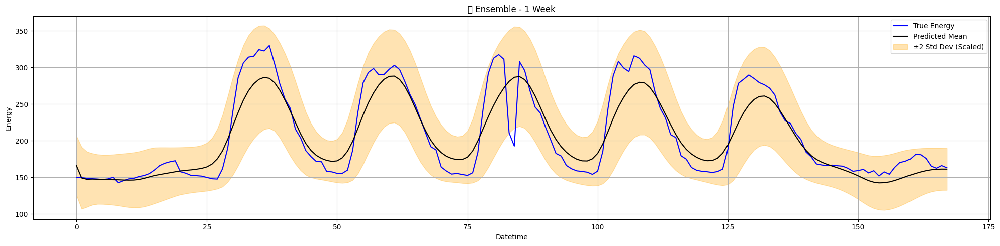

/tmp/ipykernel_2023626/1192307531.py:156: UserWarning: Glyph 128197 (\N{CALENDAR}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/home/agolbidi/venv/lib/python3.10/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 128197 (\N{CALENDAR}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


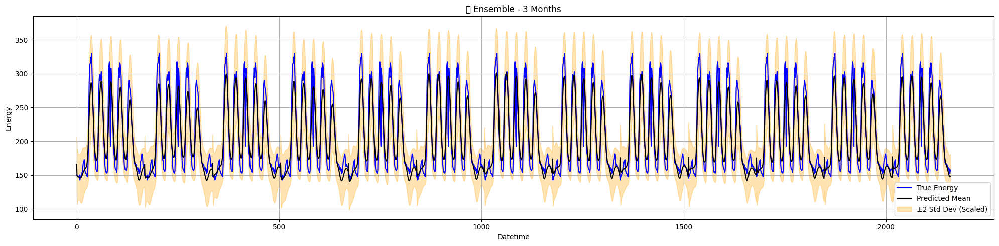

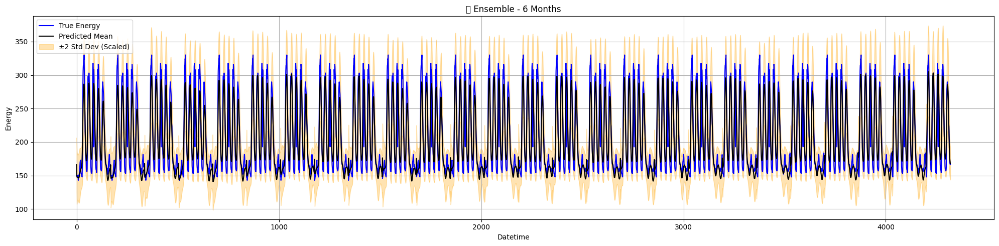

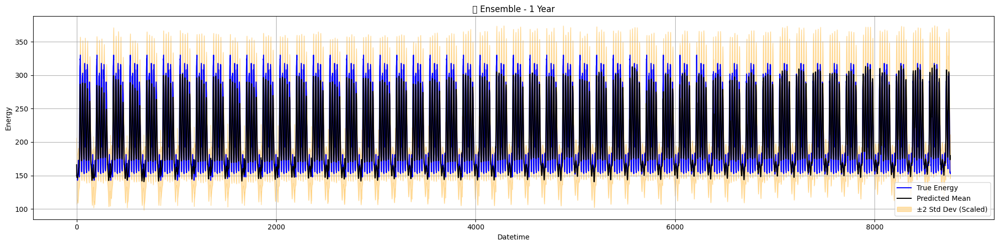

/tmp/ipykernel_2023626/1192307531.py:156: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/home/agolbidi/venv/lib/python3.10/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


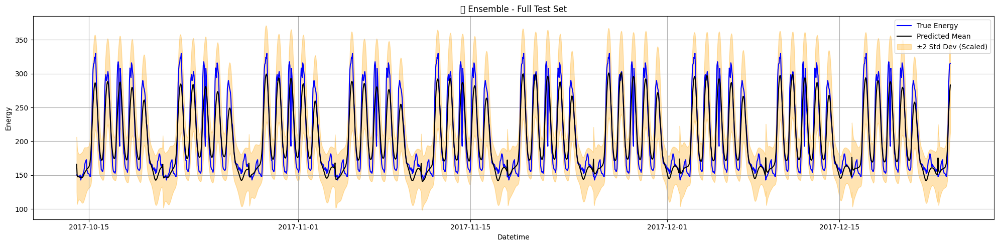

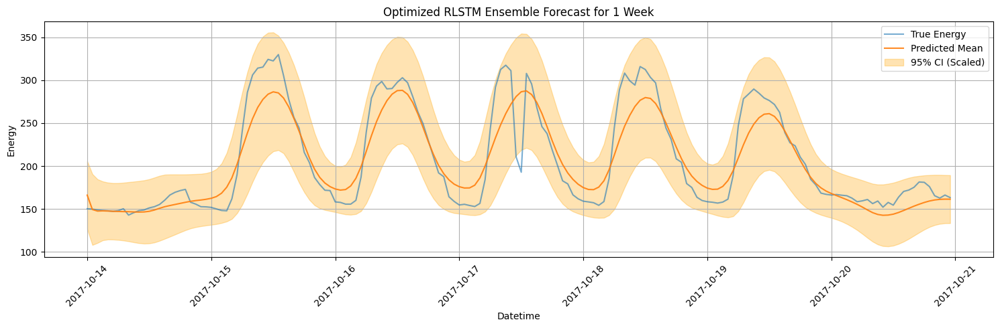

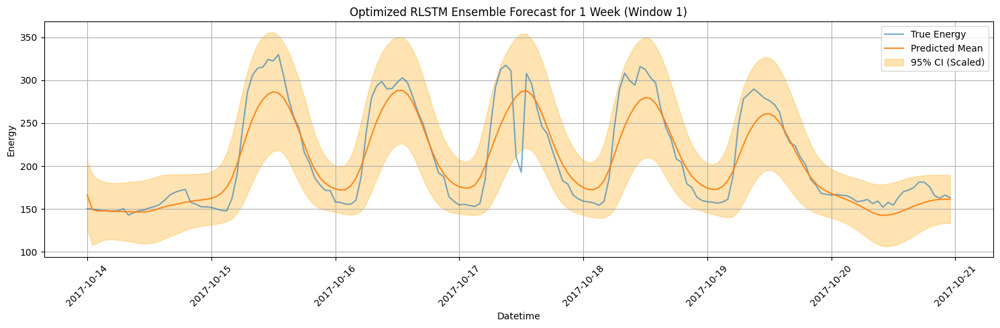

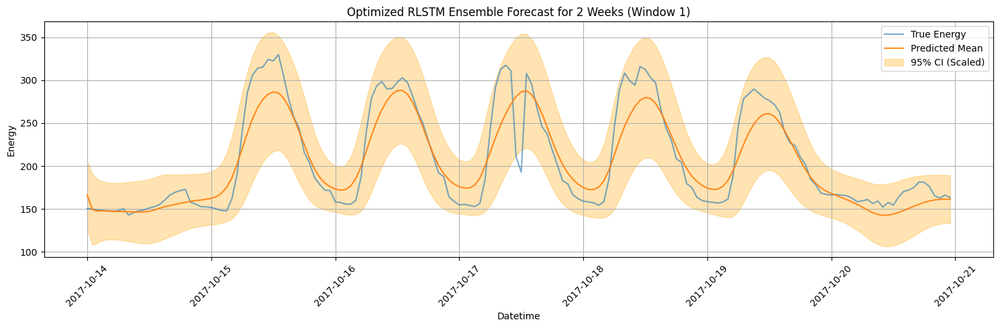

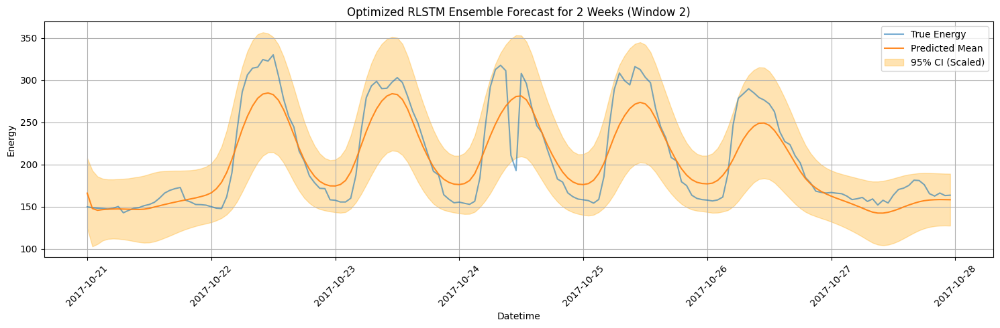

...

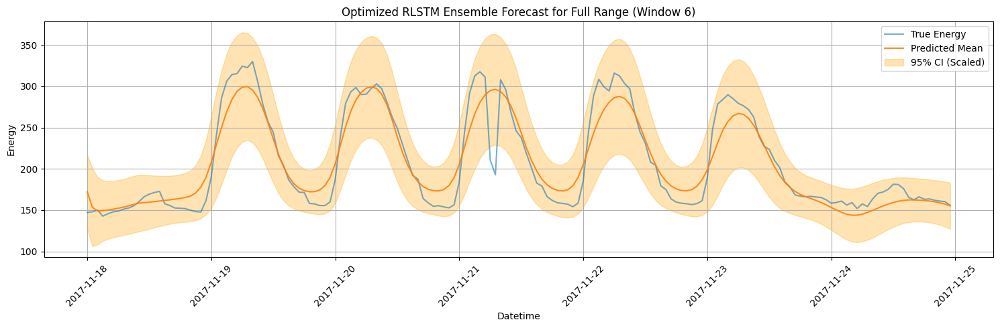

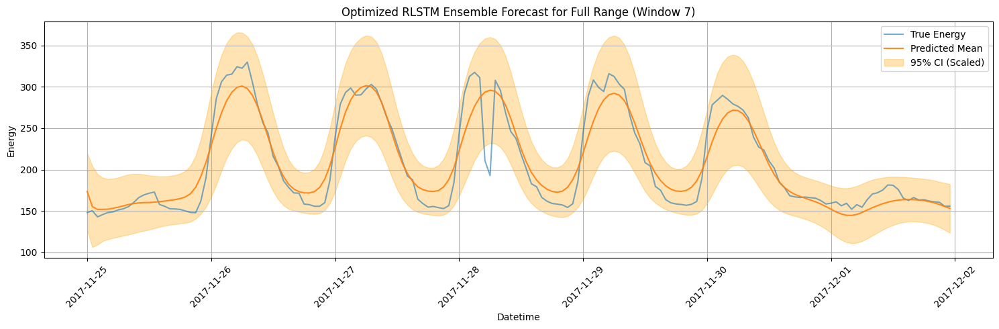

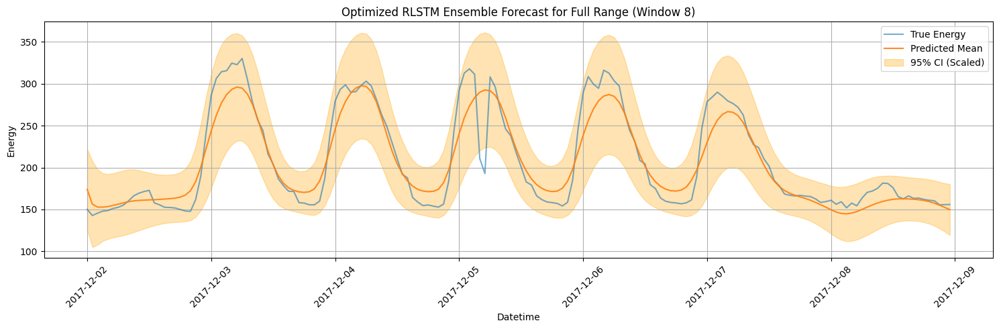

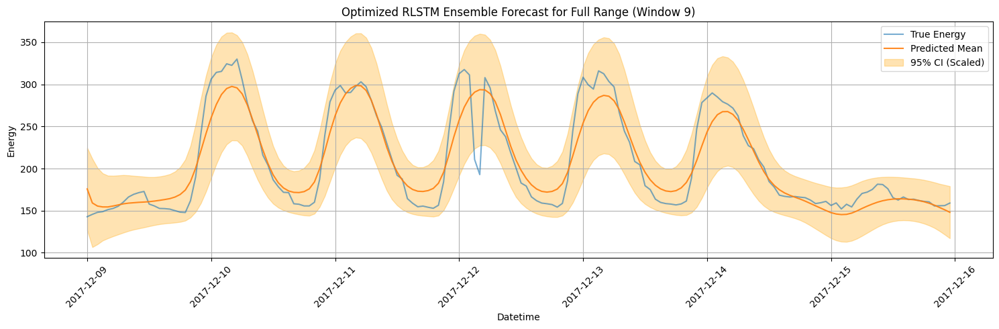

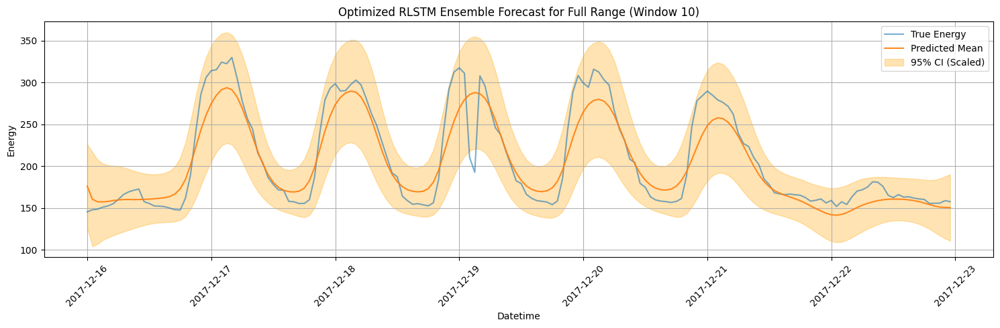

In [ ]:
import os
os.environ["CUDA_VISIBLE_DEVICES"] = "0"
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_absolute_error, mean_squared_error
import tensorflow as tf
from tensorflow.keras import layers, models, optimizers, Input, callbacks
from datetime import timedelta
import gc

# --- Force GPU:1 ---
os.environ["CUDA_VISIBLE_DEVICES"] = "1"

# --- Hyperparameters ---
lstm_units = 512
learning_rate = 1e-4
dense_units = 100
lambda_reg = 0.0003  # Slightly reduced regularization
input_window = 336
output_window = 168
n_ensemble = 5
epochs = 150
batch_size = 16
dropout_rate = 0.1
random_seed_base = 42
variance_scale = 0.8  # New: Scales down uncertainty by 20%

# --- Selected features ---
selected_features = [
    'air_temperature', 'cloud_amount', 'dewpoint_temperature', 'diffuse_r', 'elspot',
    'energy', 'full_solar', 'global_r', 'gust_speed', 'horizontal_visibility',
    'pressure', 'relative_humidity', 'sunshine', 'wind_direction', 'wind_speed',
    'hour', 'weekday', 'month', 'is_weekend', 'is_holiday', 'is_long_holiday',
    'avg_temperature', 'temp_lag1', 'is_peak_hour'
]

# --- Load datasets ---
holidays_df = pd.read_excel("3.Holydays .xlsx")
holidays_df['DateKEY'] = pd.to_datetime(holidays_df['DateKEY'], format='%Y%m%d')
df_Train = pd.read_excel("2_weather_data_training_2.xlsx")
df_Val = pd.read_excel("1_weather_data_validation_1.xlsx")
df_Test = pd.read_excel("0_weather_data_testing_0.xlsx")

# --- Feature engineering ---
def create_enhanced_features(df, holidays_df):
    df['datetime'] = pd.to_datetime(df['datetime'])
    df['is_weekend'] = df['datetime'].dt.weekday.isin([5, 6]).astype(int)
    df['is_holiday'] = df['datetime'].dt.date.isin(holidays_df['DateKEY'].dt.date).astype(int)
    df['is_long_holiday'] = df['is_holiday'].rolling(window=7).sum().ffill()
    if 'air_temperature' in df.columns:
        df['avg_temperature'] = df['air_temperature'].rolling(window=7).mean().ffill()
        df['temp_lag1'] = df['air_temperature'].shift(1).ffill()
    df['hour'] = df['datetime'].dt.hour
    df['weekday'] = df['datetime'].dt.weekday
    df['month'] = df['datetime'].dt.month
    df['is_peak_hour'] = df['hour'].isin([8, 9, 17, 18]).astype(int)
    df[selected_features] = df[selected_features].fillna(df[selected_features].mean())
    return df

df_Train = create_enhanced_features(df_Train, holidays_df)
df_Val = create_enhanced_features(df_Val, holidays_df)
df_Test = create_enhanced_features(df_Test, holidays_df)

# --- Normalize data ---
scaler_X = StandardScaler()
scaler_y = StandardScaler()
X_train_full = scaler_X.fit_transform(df_Train[selected_features])
X_val_full = scaler_X.transform(df_Val[selected_features])
X_test_full = scaler_X.transform(df_Test[selected_features])
y_train_full = scaler_y.fit_transform(df_Train['energy'].values.reshape(-1, 1))
y_val_full = scaler_y.transform(df_Val['energy'].values.reshape(-1, 1))
y_test_full = scaler_y.transform(df_Test['energy'].values.reshape(-1, 1))

# --- Sliding window ---
def create_sliding_windows(X_full, y_full, input_window, output_window):
    X, y = [], []
    for i in range(len(X_full) - input_window - output_window + 1):
        X.append(X_full[i:i + input_window])
        y.append(y_full[i + input_window:i + input_window + output_window].flatten())
    return np.array(X), np.array(y)

X_train, y_train = create_sliding_windows(X_train_full, y_train_full, input_window, output_window)
X_val, y_val = create_sliding_windows(X_val_full, y_val_full, input_window, output_window)
X_test, y_test = create_sliding_windows(X_test_full, y_test_full, input_window, output_window)
time_test = pd.Series(pd.to_datetime(df_Test['datetime'])[input_window:input_window + len(y_test)])

X_train = X_train.reshape((-1, input_window, len(selected_features)))
X_val = X_val.reshape((-1, input_window, len(selected_features)))
X_test = X_test.reshape((-1, input_window, len(selected_features)))
y_train = y_train.reshape((-1, output_window))
y_val = y_val.reshape((-1, output_window))
y_test = y_test.reshape((-1, output_window))

# --- TensorFlow dataset ---
def create_tf_dataset(X, y, batch_size=16):
    dataset = tf.data.Dataset.from_tensor_slices((X, y))
    return dataset.shuffle(buffer_size=10000).batch(batch_size).prefetch(tf.data.AUTOTUNE)

train_dataset = create_tf_dataset(X_train, y_train, batch_size)
val_dataset = create_tf_dataset(X_val, y_val, batch_size)

# --- Hybrid NLL + MSE loss ---
@tf.function
def hybrid_loss(y_true, y_pred, alpha=0.3):  # Reduced alpha to prioritize MSE, reducing variance
    mu = y_pred[:, :, 0]
    log_var = y_pred[:, :, 1]
    var = tf.nn.softplus(log_var) + 1e-6
    nll = tf.reduce_mean(0.5 * (tf.math.log(var) + tf.square(y_true - mu) / var))
    mse = tf.reduce_mean(tf.square(y_true - mu))
    reg = lambda_reg * tf.reduce_mean(log_var ** 2)
    return alpha * nll + (1 - alpha) * mse + reg

# --- RLSTM Model ---
def build_rlstm_model(input_shape, output_window=168, seed=None):
    tf.random.set_seed(seed)
    inputs = Input(shape=input_shape)
    x = layers.LSTM(lstm_units, return_sequences=True, dropout=dropout_rate,
                    kernel_initializer=tf.keras.initializers.GlorotNormal(seed=seed))(inputs)
    x = layers.LSTM(lstm_units // 2, return_sequences=True, dropout=dropout_rate,
                    kernel_initializer=tf.keras.initializers.GlorotNormal(seed=seed+1))(x)
    x = layers.LSTM(lstm_units // 4, return_sequences=False, dropout=dropout_rate,
                    kernel_initializer=tf.keras.initializers.GlorotNormal(seed=seed+2))(x)
    x = layers.RepeatVector(output_window)(x)
    decoder_input = layers.LSTM(lstm_units // 2, return_sequences=True, dropout=dropout_rate,
                               kernel_initializer=tf.keras.initializers.GlorotNormal(seed=seed+3))(x)
    x = layers.LSTM(lstm_units // 4, return_sequences=True, dropout=dropout_rate,
                    kernel_initializer=tf.keras.initializers.GlorotNormal(seed=seed+4))(decoder_input)
    x = layers.TimeDistributed(layers.Dense(dense_units, activation='relu',
                     kernel_initializer=tf.keras.initializers.GlorotNormal(seed=seed+5)))(x)
    outputs = layers.TimeDistributed(layers.Dense(2, kernel_initializer=tf.keras.initializers.GlorotNormal(seed=seed+6),
                          bias_initializer=tf.keras.initializers.Constant(value=[0.0, -3.0])))(x)
    model = models.Model(inputs, outputs)
    model.compile(optimizer=optimizers.Adam(learning_rate), loss=lambda y_true, y_pred: hybrid_loss(y_true, y_pred, alpha=0.3))
    return model

# --- Plotting function ---
def plot_with_uncertainty(y_true, mu, std, start_idx, end_idx, title, x_range=None):
    plt.figure(figsize=(20, 5))
    if x_range is None:
        x_range = range(start_idx, end_idx)
    max_len = min(len(y_true), len(mu), len(std), len(x_range))
    end_idx = start_idx + max_len
    plt.plot(x_range[start_idx:end_idx], y_true[start_idx:end_idx], label='True Energy', color='blue')
    plt.plot(x_range[start_idx:end_idx], mu[start_idx:end_idx], label='Predicted Mean', color='black')
    plt.fill_between(x_range[start_idx:end_idx],
                     mu[start_idx:end_idx] - 2 * std[start_idx:end_idx] * variance_scale,
                     mu[start_idx:end_idx] + 2 * std[start_idx:end_idx] * variance_scale,
                     color='orange', alpha=0.3, label='±2 Std Dev (Scaled)')
    plt.title(title)
    plt.xlabel("Hour" if x_range is None else "Datetime")
    plt.ylabel("Energy")
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.show()

# --- Train ensemble ---
ensemble_models = []
for i in range(n_ensemble):
    print(f"Training RLSTM model {i+1}/{n_ensemble}")
    model = build_rlstm_model((input_window, len(selected_features)), output_window=output_window, seed=random_seed_base + i)
    model.fit(train_dataset, validation_data=val_dataset, epochs=epochs,
              callbacks=[
                  callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=10, min_lr=1e-6),
                  callbacks.EarlyStopping(monitor='val_loss', patience=20, restore_best_weights=True, min_delta=0.001),
                  callbacks.ModelCheckpoint(f'model_{i+1}.h5', monitor='val_loss', save_best_only=True, mode='min')
              ], verbose=2)
    ensemble_models.append(model)
    tf.keras.backend.clear_session()
    gc.collect()

# --- Prediction with uncertainty ---
def predict_with_total_variance(ensemble_models, X_test, n_samples=10):
    all_preds = []
    for model in ensemble_models:
        model_preds = []
        for _ in range(n_samples):
            pred = model(X_test, training=True).numpy()
            model_preds.append(pred)
        all_preds.append(np.mean(model_preds, axis=0))
    mu_m = np.array([pred[:, :, 0] for pred in all_preds])
    log_var_m = np.array([pred[:, :, 1] for pred in all_preds])
    var_m = tf.nn.softplus(log_var_m) + 1e-6
    mean_mu = np.mean(mu_m, axis=0)
    mean_var = np.mean(var_m, axis=0)
    var_between = np.var(mu_m, axis=0) * 0.5  # Reduce between-model variance contribution
    total_var = mean_var + var_between
    std = np.sqrt(total_var)
    return mean_mu, std

mean_pred, std_pred = predict_with_total_variance(ensemble_models, X_test)

# --- Inverse transform ---
mean_pred = scaler_y.inverse_transform(mean_pred.reshape(-1, output_window)).reshape(-1, output_window)
y_test = scaler_y.inverse_transform(y_test.reshape(-1, output_window)).reshape(-1, output_window)
std_pred = std_pred.reshape(-1, output_window) * scaler_y.scale_[0]
total_var = std_pred ** 2

# --- Evaluation ---
mae = mean_absolute_error(y_test.flatten(), mean_pred.flatten())
rmse = np.sqrt(mean_squared_error(y_test.flatten(), mean_pred.flatten()))
nll = np.mean(0.5 * (np.log(total_var.flatten()) + (y_test.flatten() - mean_pred.flatten())**2 / total_var.flatten()) + 0.5 * np.log(2 * np.pi))
coverage = np.mean((y_test >= (mean_pred - 1.96 * std_pred)) & (y_test <= (mean_pred + 1.96 * std_pred)))
print(f"\n📊 Optimized RLSTM Ensemble Evaluation (7-day Forecast)")
print(f"MAE:  {mae:.2f}")
print(f"RMSE: {rmse:.2f}")
print(f"NLL:  {nll:.2f}")
print(f"Coverage (95% CI): {coverage:.2%}")

# --- Plot final ensemble forecast with uncertainty ---
mu_flat = mean_pred.reshape(-1)
std_flat = std_pred.reshape(-1)
y_true_flat = y_test.reshape(-1)

plot_with_uncertainty(y_true_flat, mu_flat, std_flat, 0, 168, "🕐 Ensemble - 1 Week")
plot_with_uncertainty(y_true_flat, mu_flat, std_flat, 0, 24*30*3, "📅 Ensemble - 3 Months")
plot_with_uncertainty(y_true_flat, mu_flat, std_flat, 0, 24*30*6, "📅 Ensemble - 6 Months")
plot_with_uncertainty(y_true_flat, mu_flat, std_flat, 0, 24*365, "📅 Ensemble - 1 Year")
plot_with_uncertainty(y_true_flat, mu_flat, std_flat, 0, len(mu_flat), "📊 Ensemble - Full Test Set", time_test)

# --- Plot: 1 Week Forecast ---
week_indices = slice(0, output_window)
time_week = time_test[week_indices]
true_week = y_test[0]
mean_week = mean_pred[0]
std_week = std_pred[0]

plt.figure(figsize=(15, 5))
plt.plot(time_week, true_week, label="True Energy", alpha=0.6)
plt.plot(time_week, mean_week, label="Predicted Mean", alpha=0.9)
plt.fill_between(time_week, mean_week - 1.96 * std_week * variance_scale, mean_week + 1.96 * std_week * variance_scale,
                 color='orange', alpha=0.3, label="95% CI (Scaled)")
plt.title("Optimized RLSTM Ensemble Forecast for 1 Week")
plt.xlabel("Datetime")
plt.ylabel("Energy")
plt.xticks(rotation=45)
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

# --- Plot: Multiple Time Horizons ---
time_spans = {
    '1 Week': timedelta(weeks=1),
    '2 Weeks': timedelta(weeks=2),
    '1 Month': timedelta(days=30),
    '3 Months': timedelta(days=90),
    '6 Months': timedelta(days=180),
    '1 Year': timedelta(days=365),
    'Full Range': time_test.iloc[-1] - time_test.iloc[0]
}

for label, delta in time_spans.items():
    start_time = time_test.iloc[0]
    end_time = start_time + delta
    mask = (time_test >= start_time) & (time_test <= end_time)
    if mask.sum() < output_window:
        continue
    time_range = time_test[mask]
    n_windows = len(time_range) // output_window
    for i in range(n_windows):
        start_idx = i * output_window
        end_idx = min((i + 1) * output_window, len(time_range))
        if end_idx <= start_idx:
            break
        time_window = time_range[start_idx:end_idx]
        true_values = y_test[i][:end_idx - start_idx] if i < len(y_test) else y_test[-1][:end_idx - start_idx]
        mean_values = mean_pred[i][:end_idx - start_idx] if i < len(mean_pred) else mean_pred[-1][:end_idx - start_idx]
        std_values = std_pred[i][:end_idx - start_idx] if i < len(std_pred) else std_pred[-1][:end_idx - start_idx]

        plt.figure(figsize=(15, 5))
        plt.plot(time_window, true_values, label="True Energy", alpha=0.6)
        plt.plot(time_window, mean_values, label="Predicted Mean", alpha=0.9)
        plt.fill_between(time_window, mean_values - 1.96 * std_values * variance_scale, mean_values + 1.96 * std_values * variance_scale,
                         color='orange', alpha=0.3, label="95% CI (Scaled)")
        plt.title(f"Optimized RLSTM Ensemble Forecast for {label} (Window {i+1})")
        plt.xlabel("Datetime")
        plt.ylabel("Energy")
        plt.xticks(rotation=45)
        plt.grid(True)
        plt.legend()
        plt.tight_layout()
        plt.show()

✅ Excel file 'weekly_predictions.xlsx' with uncertainty saved successfully.


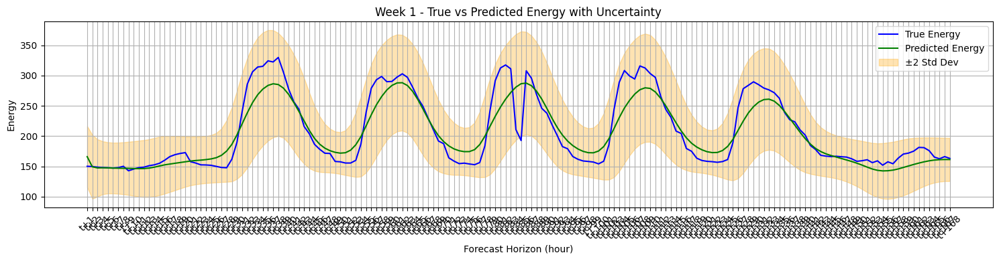

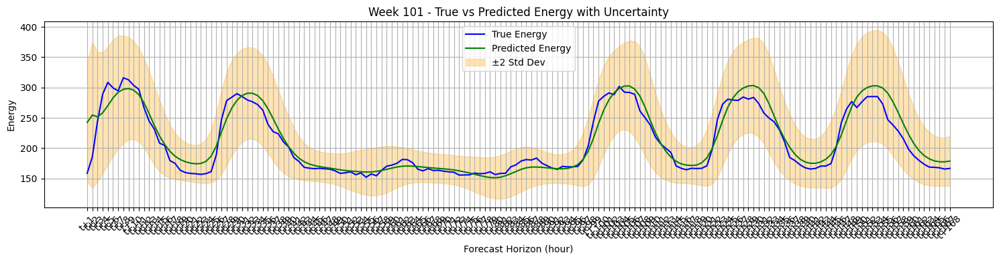

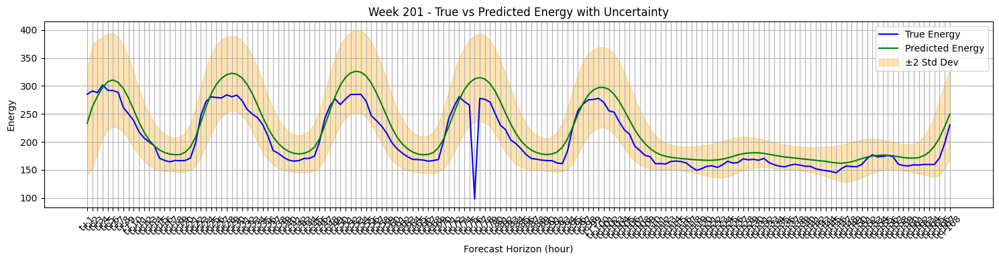

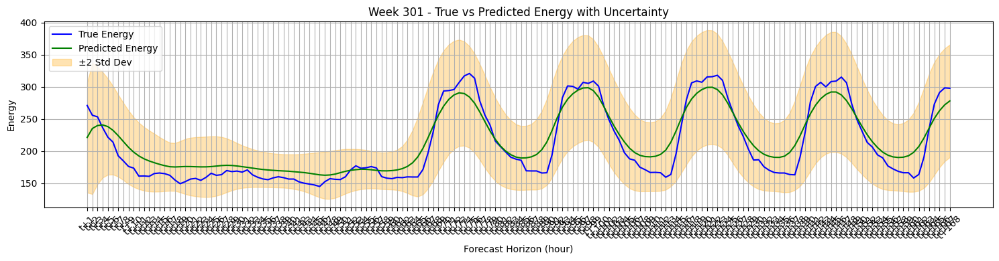

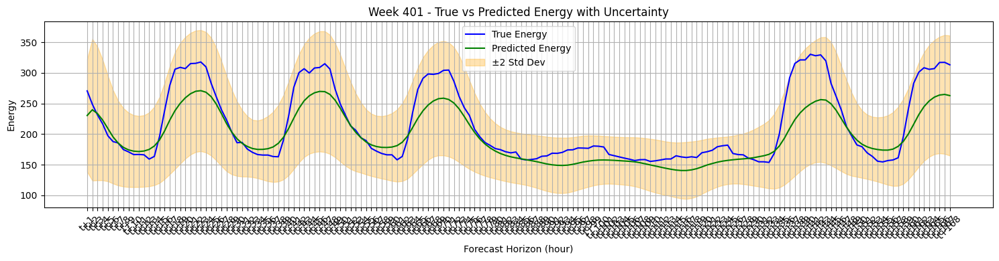

...

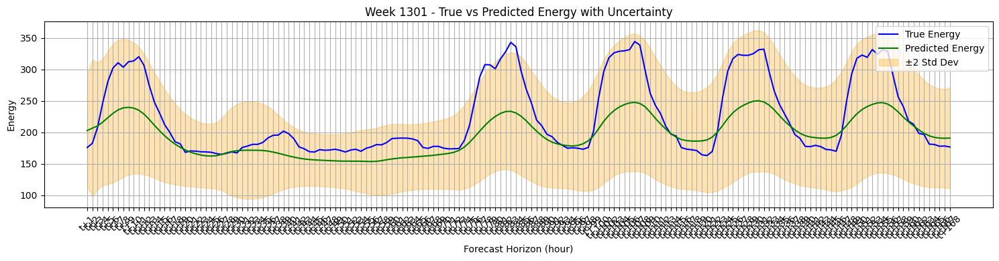

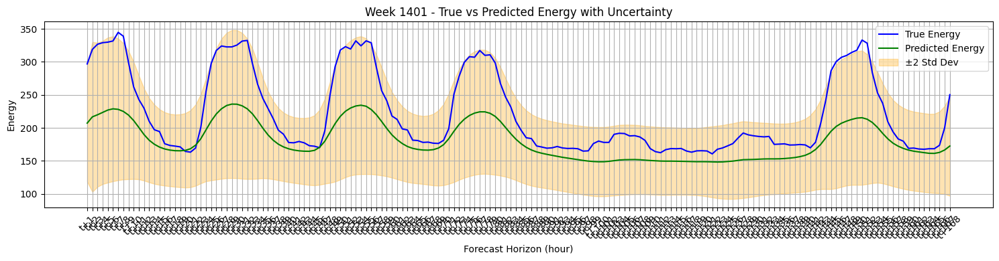

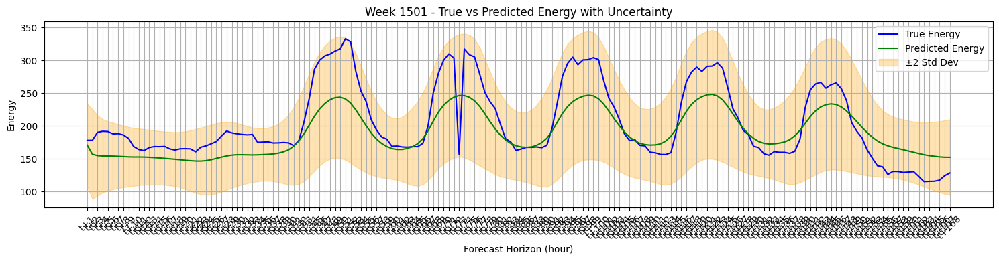

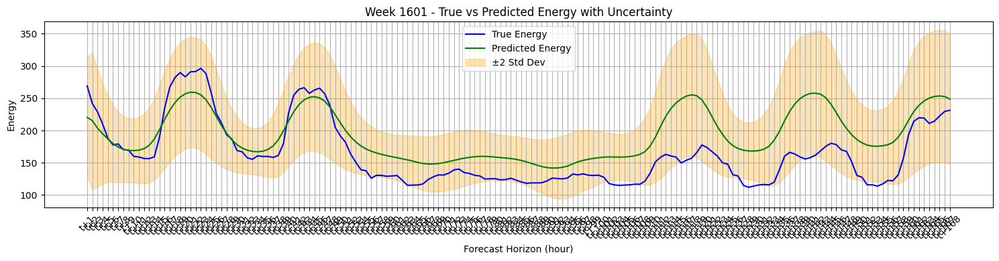

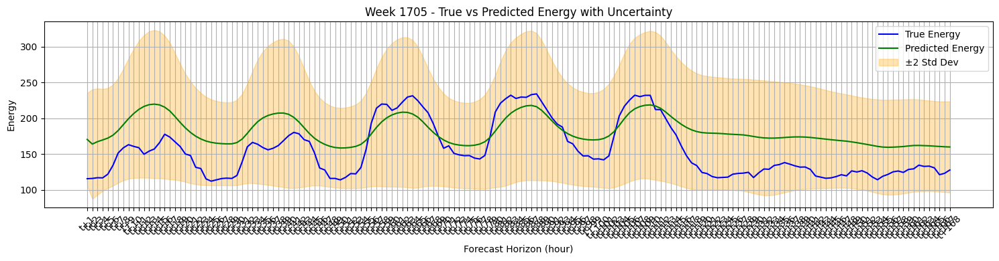

/tmp/ipykernel_2023626/109785090.py:100: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  time_axis = pd.date_range(start=start_time, periods=len(flat_pred), freq='H')


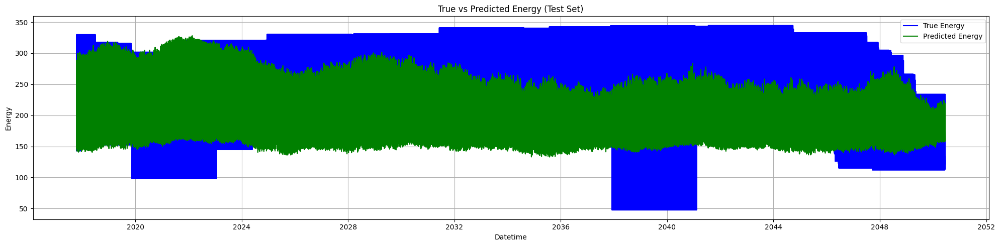

In [53]:
import pandas as pd

# تبدیل لیست‌های 2D به DataFrame
df_true = pd.DataFrame(y_test, columns=[f"t+{i+1}" for i in range(output_window)])
df_pred = pd.DataFrame(mean_pred, columns=[f"t+{i+1}" for i in range(output_window)])
df_std = pd.DataFrame(std_pred, columns=[f"t+{i+1}" for i in range(output_window)])

# افزودن شماره هفته یا ایندکس
df_true.insert(0, "Week", range(1, len(df_true)+1))
df_pred.insert(0, "Week", range(1, len(df_pred)+1))
df_std.insert(0, "Week", range(1, len(df_std)+1))

# ایجاد writer برای ذخیره در سه شیت جداگانه
with pd.ExcelWriter("weekly_predictions2.xlsx") as writer:
    df_true.to_excel(writer, sheet_name="True Energy", index=False)
    df_pred.to_excel(writer, sheet_name="Predicted Energy", index=False)
    df_std.to_excel(writer, sheet_name="Uncertainty (StdDev)", index=False)

print("✅ Excel file 'weekly_predictions.xlsx' with uncertainty saved successfully.")

################################################################# Make excel files from outputs


import pandas as pd
import matplotlib.pyplot as plt

# خواندن فایل اکسل
df_true = pd.read_excel("weekly_predictions2.xlsx", sheet_name="True Energy")
df_pred = pd.read_excel("weekly_predictions2.xlsx", sheet_name="Predicted Energy")
df_std = pd.read_excel("weekly_predictions2.xlsx", sheet_name="Uncertainty (StdDev)")

# لیست هفته‌ها با فاصله 100
weeks_to_plot = list(range(1, 1701, 100))

# حلقه برای رسم نمودار هر هفته
for week_num in weeks_to_plot:
    # استخراج داده‌ها
    true_week = df_true[df_true["Week"] == week_num].iloc[0, 1:].values
    pred_week = df_pred[df_pred["Week"] == week_num].iloc[0, 1:].values
    std_week = df_std[df_std["Week"] == week_num].iloc[0, 1:].values
    hours = [f"t+{i+1}" for i in range(len(true_week))]

    # رسم نمودار با ناحیه عدم قطعیت
    plt.figure(figsize=(15, 4))
    plt.plot(hours, true_week, label="True Energy", color='blue')
    plt.plot(hours, pred_week, label="Predicted Energy", color='green')
    plt.fill_between(hours, pred_week - 2 * std_week, pred_week + 2 * std_week,
                     color='orange', alpha=0.3, label="±2 Std Dev")
    plt.title(f"Week {week_num} - True vs Predicted Energy with Uncertainty")
    plt.xlabel("Forecast Horizon (hour)")
    plt.ylabel("Energy")
    plt.xticks(rotation=45)
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.show()


    ### Week 1705
    import pandas as pd
import matplotlib.pyplot as plt

# شماره هفته
week_num = 1705

# خواندن داده‌ها از فایل اکسل
df_true = pd.read_excel("weekly_predictions2.xlsx", sheet_name="True Energy")
df_pred = pd.read_excel("weekly_predictions2.xlsx", sheet_name="Predicted Energy")
df_std  = pd.read_excel("weekly_predictions2.xlsx", sheet_name="Uncertainty (StdDev)")

# استخراج داده‌های آن هفته
true_week = df_true[df_true["Week"] == week_num].iloc[0, 1:].values
pred_week = df_pred[df_pred["Week"] == week_num].iloc[0, 1:].values
std_week  = df_std[df_std["Week"] == week_num].iloc[0, 1:].values
hours = [f"t+{i+1}" for i in range(len(true_week))]

# رسم نمودار
plt.figure(figsize=(15, 4))
plt.plot(hours, true_week, label="True Energy", color='blue')
plt.plot(hours, pred_week, label="Predicted Energy", color='green')
plt.fill_between(hours, pred_week - 2 * std_week, pred_week + 2 * std_week,
                 color='orange', alpha=0.3, label="±2 Std Dev")
plt.title(f"Week {week_num} - True vs Predicted Energy with Uncertainty")
plt.xlabel("Forecast Horizon (hour)")
plt.ylabel("Energy")
plt.xticks(rotation=45)
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()


############################# Overal
# Flatten predicted and true values
flat_pred = mean_pred.flatten()
flat_true = y_test.flatten()

# Create a common time axis
start_time = pd.to_datetime(df_Test['datetime'].iloc[input_window])
time_axis = pd.date_range(start=start_time, periods=len(flat_pred), freq='H')

# Plot both
plt.figure(figsize=(20, 5))
plt.plot(time_axis, flat_true, label='True Energy', color='blue')
plt.plot(time_axis, flat_pred, label='Predicted Energy', color='green')
plt.title("True vs Predicted Energy (Test Set)")
plt.xlabel("Datetime")
plt.ylabel("Energy")
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()




In [51]:
import shutil

src_path = "improved version.ipynb"
dst_path = "Arman nice2.ipynb"

shutil.copy(src_path, dst_path)
print("File copied successfully.")


File copied successfully.
